In [ ]:
######################################### House Rent Problem #################################################################

## Problem Statement

![](https://storage.googleapis.com/kaggle-competitions/kaggle/5407/media/housesbanner.png)

Ask a home buyer to describe their dream house, and they probably won't begin with the height of the basement ceiling or the proximity to an east-west railroad. But this playground competition's dataset proves that much more influences price negotiations than the number of bedrooms or a white-picket fence.

With 79 explanatory variables describing (almost) every aspect of residential homes in Ames, Iowa, this competition challenges you to predict the final price of each home.

**Goal**

It is your job to predict the sales price for each house. For each Id in the test set, you must predict the value of the SalePrice variable. 

**Metric**

Submissions are evaluated on Root-Mean-Squared-Error (RMSE) between the logarithm of the predicted value and the logarithm of the observed sales price. (Taking logs means that errors in predicting expensive houses and cheap houses will affect the result equally.)

Reference Link : https://www.kaggle.com/c/house-prices-advanced-regression-techniques/overview/description

**File descriptions**

train.csv - the training set
test.csv - the test set
data_description.txt - full description of each column, originally prepared by Dean De Cock but lightly edited to match the column names used here
sample_submission.csv - a benchmark submission from a linear regression on year and month of sale, lot square footage, and number of bedrooms

**Data fields**  

Here's a brief version of what you'll find in the data description file.

SalePrice - the property's sale price in dollars. This is the target variable that you're trying to predict.

MSSubClass: The building class

MSZoning: The general zoning classification

LotFrontage: Linear feet of street connected to property

LotArea: Lot size in square feet

Street: Type of road access

Alley: Type of alley access

LotShape: General shape of property

LandContour: Flatness of the property

Utilities: Type of utilities available

LotConfig: Lot configuration

LandSlope: Slope of property

Neighborhood: Physical locations within Ames city limits

Condition1: Proximity to main road or railroad

Condition2: Proximity to main road or railroad (if a second is present)

BldgType: Type of dwelling

HouseStyle: Style of dwelling

OverallQual: Overall material and finish quality

OverallCond: Overall condition rating

YearBuilt: Original construction date

YearRemodAdd: Remodel date

RoofStyle: Type of roof

RoofMatl: Roof material

Exterior1st: Exterior covering on house

Exterior2nd: Exterior covering on house (if more than one material)

MasVnrType: Masonry veneer type

MasVnrArea: Masonry veneer area in square feet

ExterQual: Exterior material quality

ExterCond: Present condition of the material on the exterior

Foundation: Type of foundation

BsmtQual: Height of the basement

BsmtCond: General condition of the basement

BsmtExposure: Walkout or garden level basement walls

BsmtFinType1: Quality of basement finished area

BsmtFinSF1: Type 1 finished square feet

BsmtFinType2: Quality of second finished area (if present)

BsmtFinSF2: Type 2 finished square feet

BsmtUnfSF: Unfinished square feet of basement area

TotalBsmtSF: Total square feet of basement area

Heating: Type of heating

HeatingQC: Heating quality and condition

CentralAir: Central air conditioning

Electrical: Electrical system

1stFlrSF: First Floor square feet

2ndFlrSF: Second floor square feet

LowQualFinSF: Low quality finished square feet (all floors)

GrLivArea: Above grade (ground) living area square feet

BsmtFullBath: Basement full bathrooms

BsmtHalfBath: Basement half bathrooms

FullBath: Full bathrooms above grade

HalfBath: Half baths above grade

Bedroom: Number of bedrooms above basement level

Kitchen: Number of kitchens

KitchenQual: Kitchen quality

TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)

Functional: Home functionality rating

Fireplaces: Number of fireplaces

FireplaceQu: Fireplace quality

GarageType: Garage location

GarageYrBlt: Year garage was built

GarageFinish: Interior finish of the garage

GarageCars: Size of garage in car capacity

GarageArea: Size of garage in square feet

GarageQual: Garage quality

GarageCond: Garage condition

PavedDrive: Paved driveway

WoodDeckSF: Wood deck area in square feet

OpenPorchSF: Open porch area in square feet

EnclosedPorch: Enclosed porch area in square feet

3SsnPorch: Three season porch area in square feet

ScreenPorch: Screen porch area in square feet

PoolArea: Pool area in square feet

PoolQC: Pool quality

Fence: Fence quality

MiscFeature: Miscellaneous feature not covered in other categories

MiscVal: $Value of miscellaneous feature

MoSold: Month Sold

YrSold: Year Sold

SaleType: Type of sale

SaleCondition: Condition of sale

In [1]:
## Import necessary libraries.

import numpy as np ## Numpy Library ( will use to convert data frame to array or creating array etc...).
import pandas as pd ## Pandas Library (will use to load data,create data frame...etc).
import os ## For connecting to machine to get path for reading/writing files.
from sklearn.model_selection import train_test_split ## For splitting data into train and validation.
import matplotlib.pyplot as plt ## For visualization.
import seaborn as sns ## For visualization.

In [3]:
## Get current working directory.
os.getcwd()

'D:\\Python\\Pratice'

In [4]:
## Set working directory
os.chdir("D:\\DataScience\\Pratice\\House_Rent_Price")

In [5]:
## Read the train data set.
data = pd.read_csv("train.csv",header='infer',sep=',')

In [6]:
## Read the test data set.
test_data = pd.read_csv("test.csv",header='infer',sep=',')

In [704]:
## Set how many rows and columns you want to display in jupyter notebook.
pd.options.display.max_columns = 200 
pd.get_option('display.max_rows') 
pd.set_option('display.max_rows',None) 

In [705]:
## Check dimesnions of train data.
data.shape

(1460, 81)

In [706]:
## Check dimensions of test data.
test_data.shape

(1459, 80)

In [707]:
## Get first 5 records of train data.
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [708]:
## Get first 5 records of train data.
test_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [709]:
## Check summary statistics of train data.
data.describe(include='all')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1460.000000,1460.000000,1460,1201.000000,1460.000000,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460,1460,1460,1452,1452.000000,1460,1460,1460,1423,1423,1422,1423,1460.000000,1422,1460.000000,1460.000000,1460.000000,1460,1460,1460,1459,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460.000000,1460,1460.000000,770,1379,1379.000000,1379,1460.000000,1460.000000,1379,1379,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,7,281,54,1460.000000,1460.000000,1460.000000,1460,1460,1460.000000
unique,NaN,NaN,5,NaN,NaN,2,2,4,4,2,5,3,25,9,8,5,8,NaN,NaN,NaN,NaN,6,8,15,16,4,NaN,4,5,6,4,4,4,6,NaN,6,NaN,NaN,NaN,6,5,2,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,7,NaN,5,6,NaN,3,NaN,NaN,5,5,3,NaN,NaN,NaN,NaN,NaN,NaN,3,4,4,NaN,NaN,NaN,9,6,NaN
top,NaN,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,NaN,NaN,Gable,CompShg,VinylSd,VinylSd,None,NaN,TA,TA,PConc,TA,TA,No,Unf,NaN,Unf,NaN,NaN,NaN,GasA,Ex,Y,SBrkr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TA,NaN,Typ,NaN,Gd,Attchd,NaN,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,Gd,MnPrv,Shed,NaN,NaN,NaN,WD,Normal,NaN
freq,NaN,NaN,1151,NaN,NaN,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,NaN,NaN,NaN,NaN,1141,1434,515,504,864,NaN,906,1282,647,649,1311,953,430,NaN,1256,NaN,NaN,NaN,1428,741,1365,1334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,735,NaN,1360,NaN,380,870,NaN,605,NaN,NaN,1311,1326,1340,NaN,NaN,NaN,NaN,NaN,NaN,3,157,49,NaN,NaN,NaN,1267,1198,NaN
mean,730.500000,56.897260,NaN,70.049958,10516.828082,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.099315,5.575342,1971.267808,1984.865753,NaN,NaN,NaN,NaN,NaN,103.685262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,443.639726,NaN,46.549315,567.240411,1057.429452,NaN,NaN,NaN,NaN,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,NaN,6.517808,NaN,0.613014,NaN,NaN,1978.506164,NaN,1.767123,472.980137,NaN,NaN,NaN,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,NaN,NaN,NaN,43.489041,6.321918,2007.815753,NaN,NaN,180921.195890
std,421.610009,42.300571,NaN,24.284752,9981.264932,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.382997,1.112799,30.202904,20.645407,NaN,NaN,NaN,NaN,NaN,181.066207,NaN,NaN,NaN,NaN,NaN,NaN,NaN,456.098091,NaN,161.319273,441.866955,438.705324,NaN,NaN,NaN,NaN,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,NaN,1.625393,NaN,0.644666,NaN,NaN,24.689725,NaN,0.747315,213.804841,NaN,NaN,NaN,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,NaN,NaN,NaN,496.123024,2.703626,1.328095,NaN,NaN,79442.502883
min,1.000000,20.000000,NaN,21.000000,1300.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1872.000000,1950.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,2.000000,NaN,0.000000,NaN,NaN,1900.000000,NaN

In [710]:
## Check summary statistics of test data.
test_data.describe(include='all')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
count,1459.000000,1459.000000,1455,1232.000000,1459.000000,1459,107,1459,1459,1457,1459,1459,1459,1459,1459,1459,1459,1459.000000,1459.000000,1459.000000,1459.000000,1459,1459,1458,1458,1443,1444.000000,1459,1459,1459,1415,1414,1415,1417,1458.000000,1417,1458.000000,1458.000000,1458.000000,1459,1459,1459,1459,1459.000000,1459.000000,1459.000000,1459.000000,1457.000000,1457.000000,1459.000000,1459.000000,1459.000000,1459.000000,1458,1459.000000,1457,1459.00000,729,1383,1381.000000,1381,1458.000000,1458.000000,1381,1381,1459,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,3,290,51,1459.000000,1459.000000,1459.000000,1458,1459
unique,NaN,NaN,5,NaN,NaN,2,2,4,4,1,5,3,25,9,5,5,7,NaN,NaN,NaN,NaN,6,4,13,15,4,NaN,4,5,6,4,4,4,6,NaN,6,NaN,NaN,NaN,4,5,2,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,7,NaN,5,6,NaN,3,NaN,NaN,4,5,3,NaN,NaN,NaN,NaN,NaN,NaN,2,4,3,NaN,NaN,NaN,9,6
top,NaN,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,NaN,NaN,Gable,CompShg,VinylSd,VinylSd,None,NaN,TA,TA,PConc,TA,TA,No,GLQ,NaN,Unf,NaN,NaN,NaN,GasA,Ex,Y,SBrkr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TA,NaN,Typ,NaN,Gd,Attchd,NaN,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,Ex,MnPrv,Shed,NaN,NaN,NaN,WD,Normal
freq,NaN,NaN,1114,NaN,NaN,1453,70,934,1311,1457,1081,1396,218,1251,1444,1205,745,NaN,NaN,NaN,NaN,1169,1442,510,510,878,NaN,892,1256,661,634,1295,951,431,NaN,1237,NaN,NaN,NaN,1446,752,1358,1337,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,757,NaN,1357,NaN,364,853,NaN,625,NaN,NaN,1293,1328,1301,NaN,NaN,NaN,NaN,NaN,NaN,2,172,46,NaN,NaN,NaN,1258,1204
mean,2190.000000,57.378341,NaN,68.580357,9819.161069,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.078821,5.553804,1971.357779,1983.662783,NaN,NaN,NaN,NaN,NaN,100.709141,NaN,NaN,NaN,NaN,NaN,NaN,NaN,439.203704,NaN,52.619342,554.294925,1046.117970,NaN,NaN,NaN,NaN,1156.534613,325.967786,3.543523,1486.045922,0.434454,0.065202,1.570939,0.377656,2.854010,1.042495,NaN,6.385195,NaN,0.58122,NaN,NaN,1977.721217,NaN,1.766118,472.768861,NaN,NaN,NaN,93.174777,48.313914,24.243317,1.794380,17.064428,1.744345,NaN,NaN,NaN,58.167923,6.104181,2007.769705,NaN,NaN
std,421.321334,42.746880,NaN,22.376841,4955.517327,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.436812,1.113740,30.390071,21.130467,NaN,NaN,NaN,NaN,NaN,177.625900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,455.268042,NaN,176.753926,437.260486,442.898624,NaN,NaN,NaN,NaN,398.165820,420.610226,44.043251,485.566099,0.530648,0.252468,0.555190,0.503017,0.829788,0.208472,NaN,1.508895,NaN,0.64742,NaN,NaN,26.431175,NaN,0.775945,217.048611,NaN,NaN,NaN,127.744882,68.883364,67.227765,20.207842,56.609763,30.491646,NaN,NaN,NaN,630.806978,2.722432,1.301740,NaN,NaN
min,1461.000000,20.000000,NaN,21.000000,1470.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1879.000000,1950.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,407.000000,0.000000,0.000000,407.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,3.000000,NaN,0.00000,NaN,NaN,1895.000000,NaN,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.0

In [712]:
## Get columns data types of train data.
data.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [713]:
## Get columns data types of test data.
test_data.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1       float64
BsmtFinType2      object
BsmtFinSF2       float64
BsmtUnfSF        float64
TotalBsmtSF      float64
Heating           object


In [ ]:
## EDA

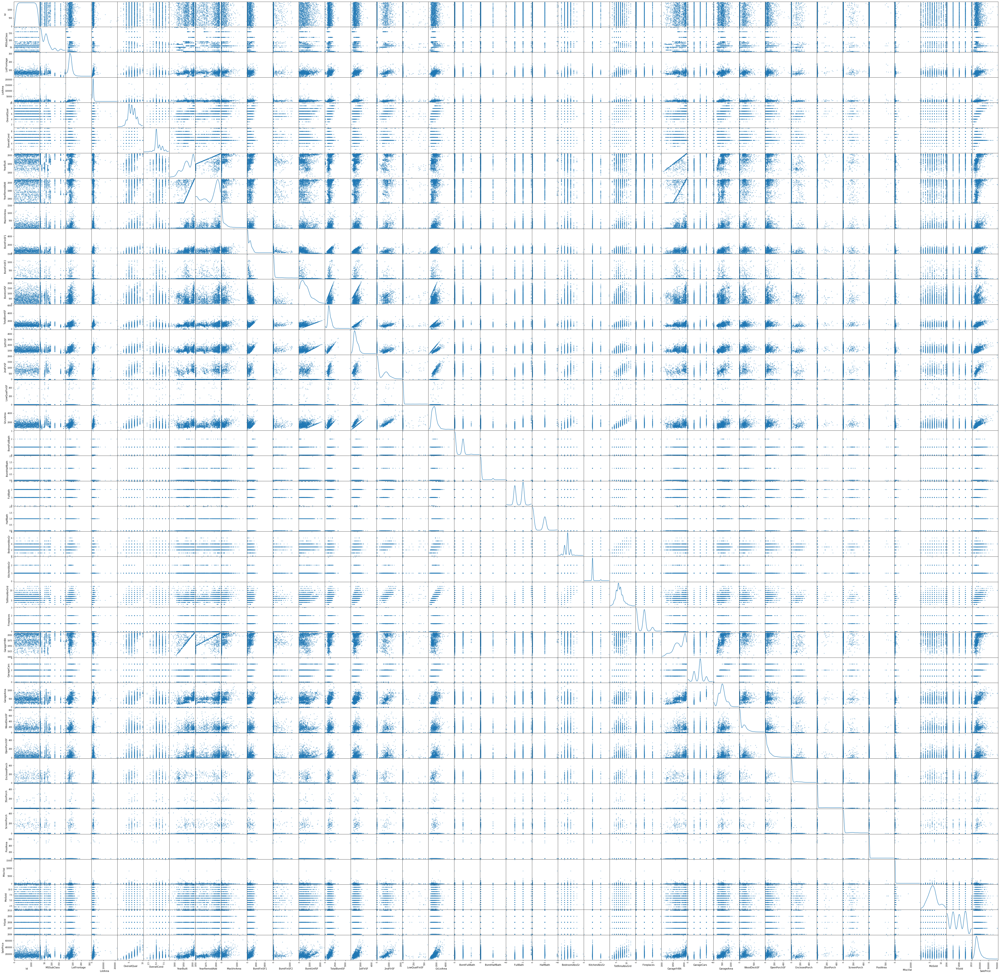

In [715]:
## Plot scatter matrix for train data.
pd.plotting.scatter_matrix(data, figsize=(75, 75), diagonal='kde')
plt.show()

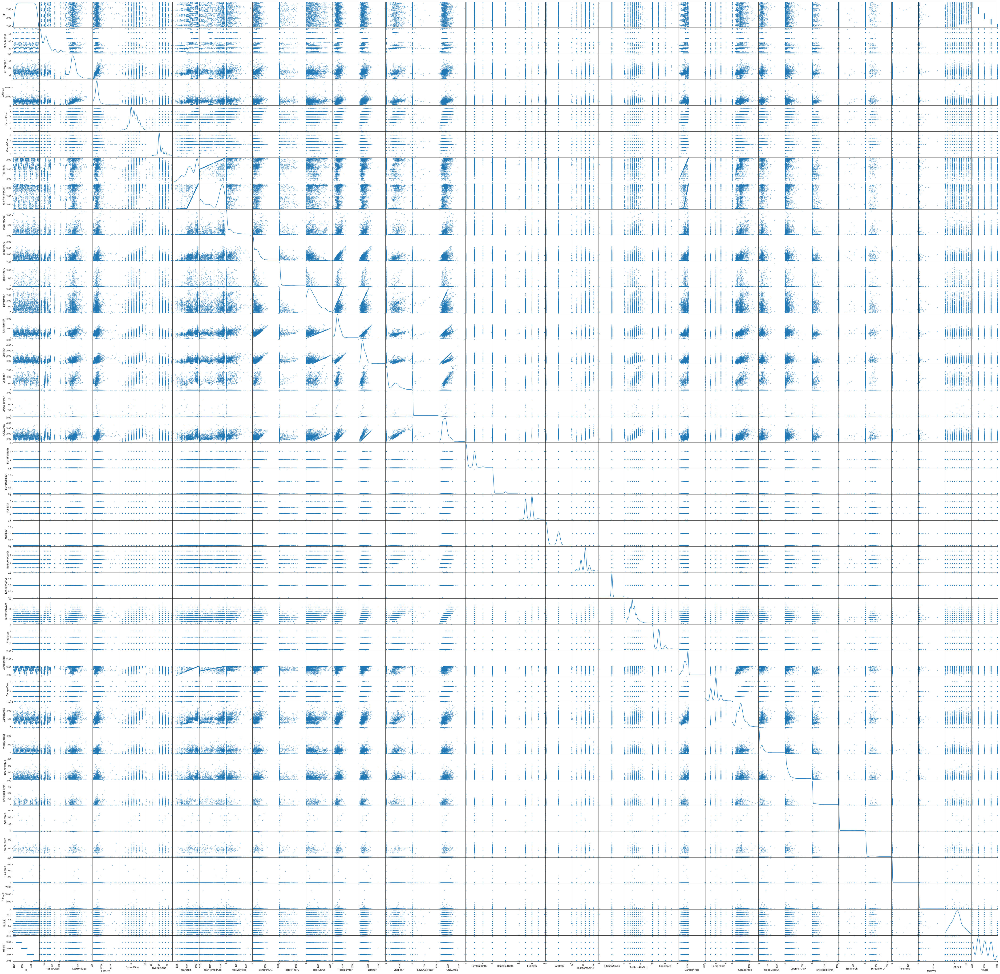

In [716]:
## Plot scatter matrix for test data.
pd.plotting.scatter_matrix(test_data, figsize=(75, 75), diagonal='kde')
plt.show()

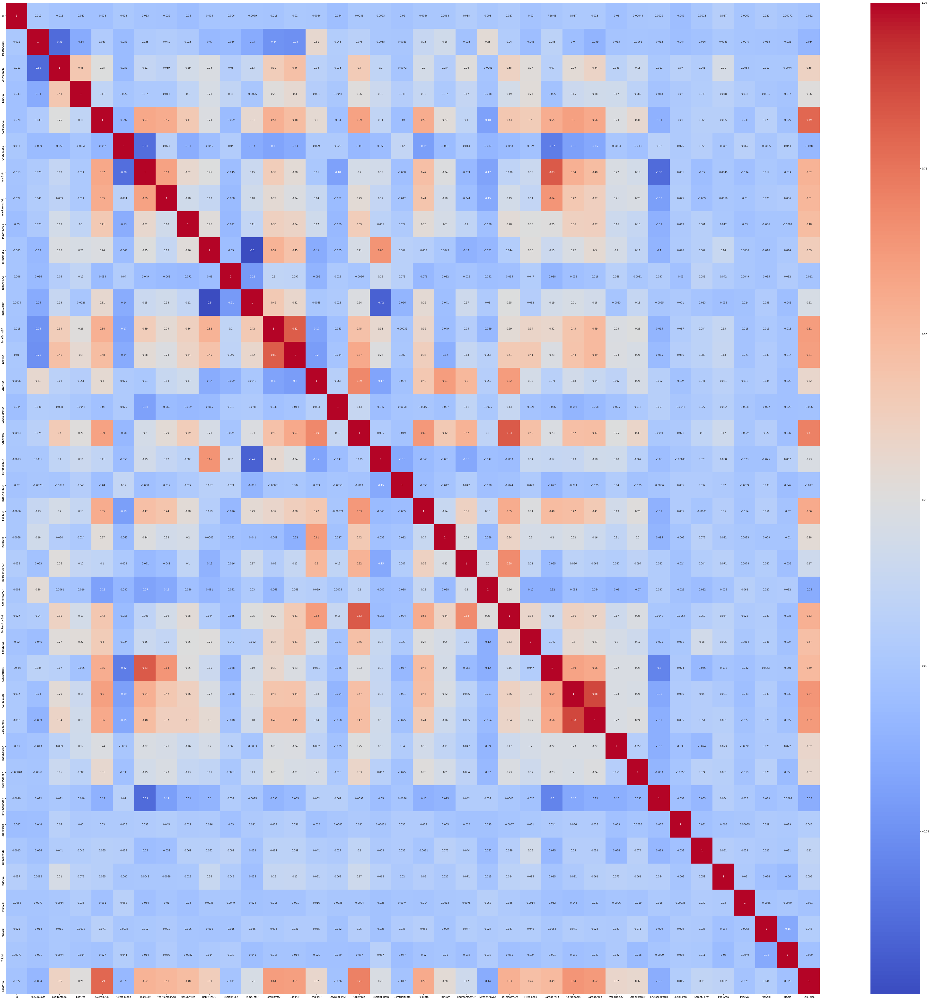

In [19]:
## Plot correlation matrix for train data.
plt.figure(figsize=(75,75))
sns.heatmap(data.corr(),cmap='coolwarm',annot = True)
plt.show()

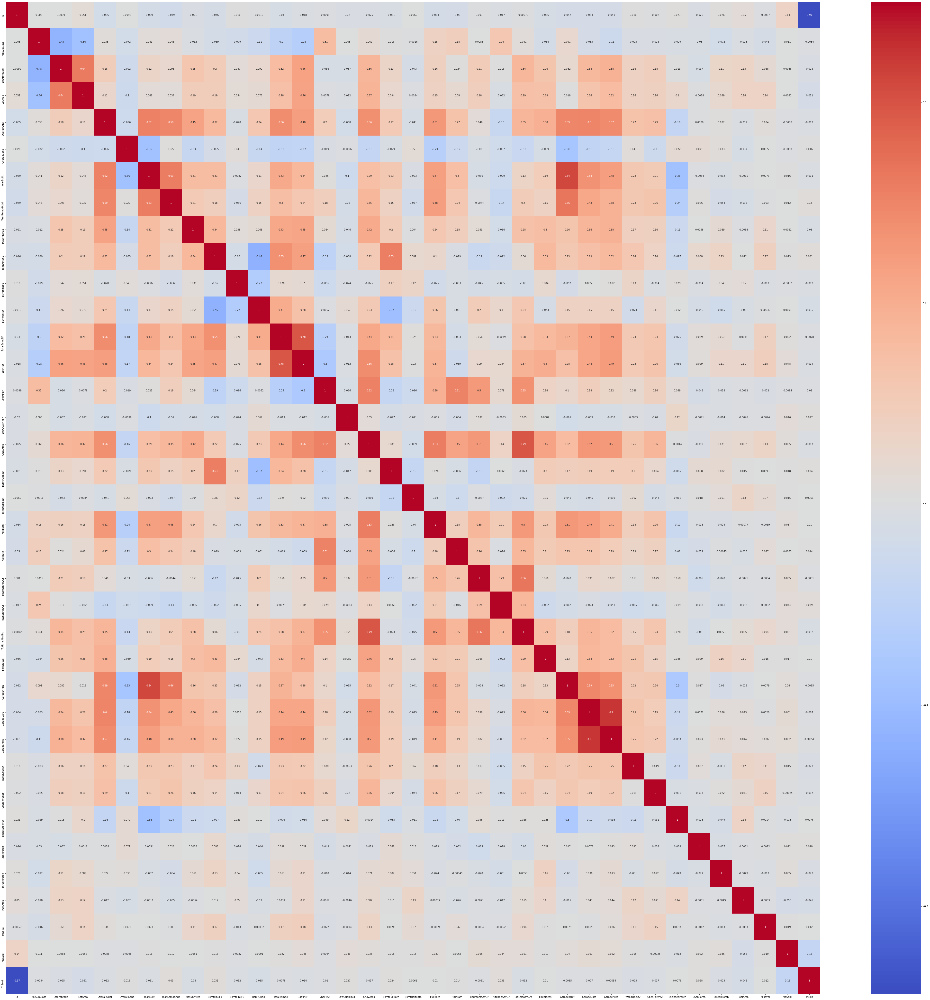

In [20]:
## Plot correlation matrix for test data.
plt.figure(figsize=(75,75))
sns.heatmap(test_data.corr(),cmap='coolwarm',annot = True)
plt.show()

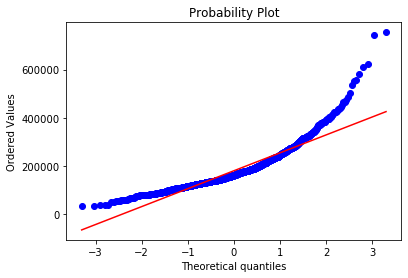

In [960]:
## Plot Probability plot for target varible.
from scipy import stats
#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(data['SalePrice'], plot=plt)
plt.show() 

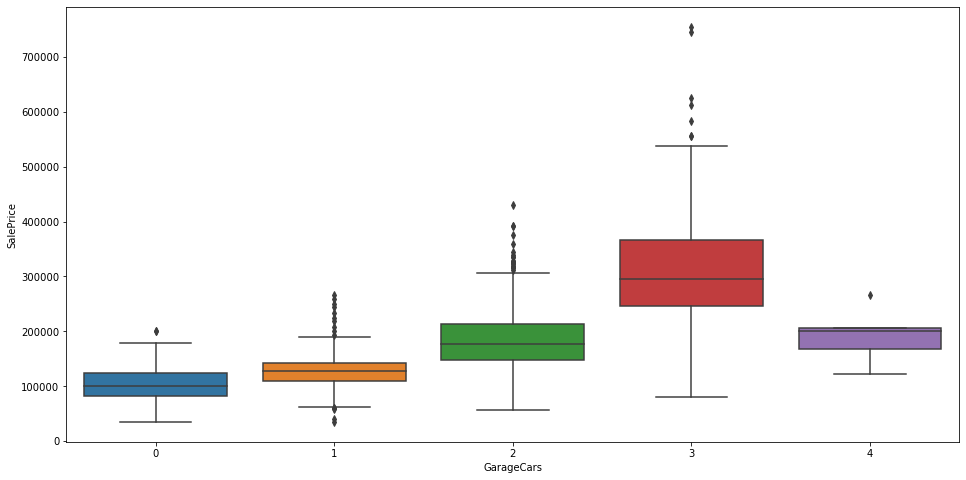

In [962]:
## Display distribution plot for target,GarageCars columns.
plt.figure(figsize=(16,8))
sns.boxplot(x='GarageCars',y='SalePrice',data=data)
plt.show()

C:\Users\nagar\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


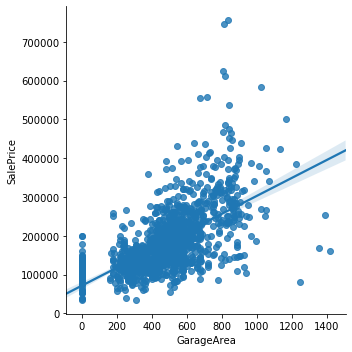

In [964]:
## Display scatter plot for GarageArea,target columns.
sns.lmplot(x='GarageArea',y='SalePrice',data=data)

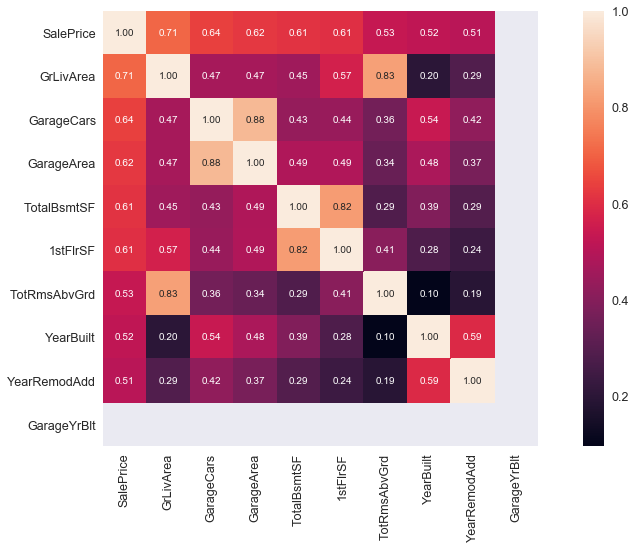

In [969]:
## Saleprice correlation matrix
k = 10 ## Number of variables for heatmap
plt.figure(figsize=(16,8))
corrmat = data.corr()
## Picking the top 15 correlated features
cols = corrmat.nlargest(k, 'SalePrice')['SalePrice'].index
cm = np.corrcoef(data[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

C:\Users\nagar\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\nagar\Anaconda3\lib\site-packages\seaborn\distributions.py:218: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  color=hist_color, **hist_kws)


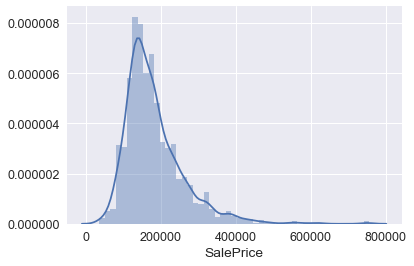

In [972]:
## Plot Histogram for target column.
sns.distplot(data['SalePrice']);

In [974]:
## Check skewness and kurtosis for target varible.
print("Skewness: %f" % data['SalePrice'].skew())
print("Kurtosis: %f" % data['SalePrice'].kurt())

Skewness: 1.882876
Kurtosis: 6.536282


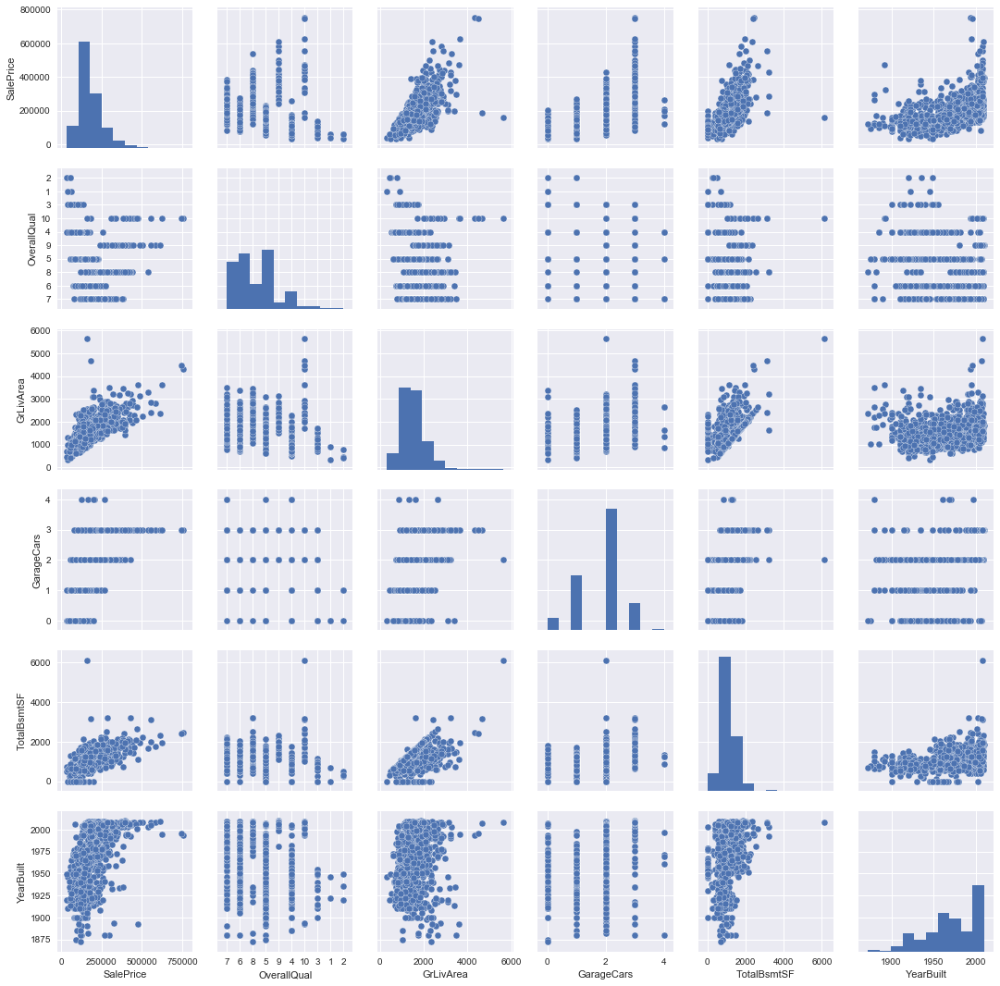

In [980]:
## Scatter plot for some columns of train data.
sns.set()
cols = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'YearBuilt']
sns.pairplot(data[cols], size = 2.5)
plt.show();

C:\Users\nagar\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\nagar\Anaconda3\lib\site-packages\seaborn\distributions.py:218: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  color=hist_color, **hist_kws)


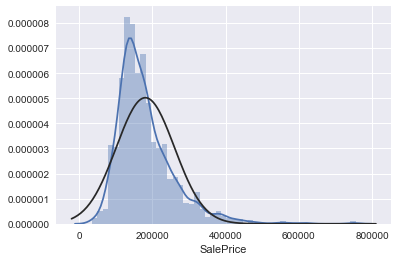

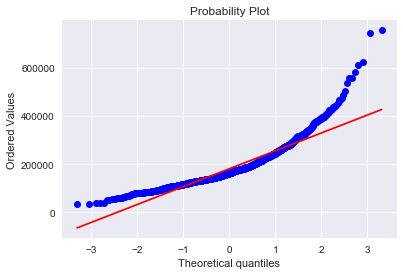

In [982]:
## Histogram and normal probability plot.
from scipy.stats import norm
sns.distplot(data['SalePrice'], fit=norm);
fig = plt.figure()
res = stats.probplot(data['SalePrice'], plot=plt)

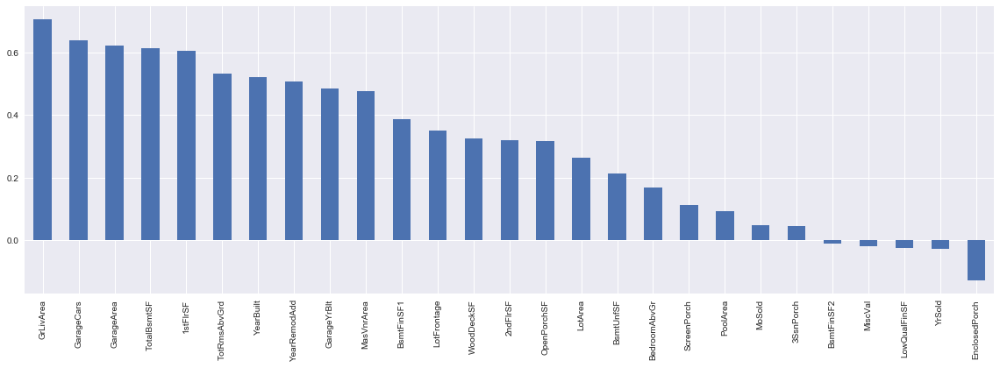

In [987]:
## Display correlation plot in desecnding order.
corr = data.select_dtypes(include=['int64','float64']).corr()
plt.figure(figsize=(16,6))
corr['SalePrice'].sort_values(ascending=False)[1:].plot(kind='bar')
plt.tight_layout()

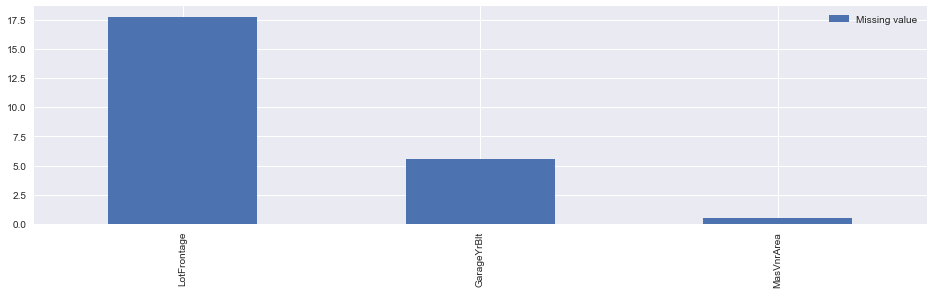

In [989]:
## Visualize missing data.
missing_value = data.isnull().sum().sort_values(ascending=False) / len(data) * 100
missing_value = missing_value[missing_value != 0]
missing_value = pd.DataFrame({'Missing value' :missing_value,'Type':missing_value.index.map(lambda x:data[x].dtype)})
missing_value.plot(kind='bar',figsize=(16,4))
plt.show()

C:\Users\nagar\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\nagar\Anaconda3\lib\site-packages\seaborn\distributions.py:218: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  color=hist_color, **hist_kws)
C:\Users\nagar\Anaconda3\lib\site-packages\seaborn\distributions.py:218: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  color=hist_color, **hist_kws)
C:\Users\nagar\Anaconda3\lib\site-packages\seaborn\distributions.py:218: MatplotlibDeprecationWarning: 
The 'n

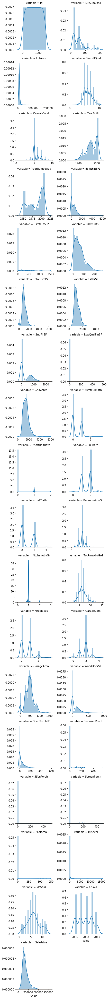

In [9]:
## Display distribution plots.
quantitative = data.select_dtypes('int64')
f = pd.melt(data, value_vars=quantitative)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False)
g = g.map(sns.distplot, "value")

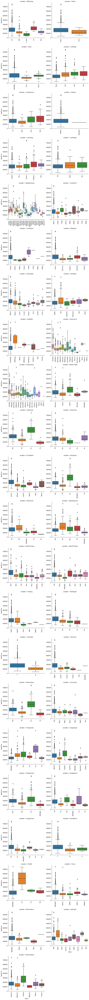

In [16]:
## Display distribution plots.
qualitative = data.select_dtypes(['object','category'])
temp = data
for c in qualitative:
    temp[c] = temp[c].astype('category')
    if temp[c].isnull().any():
        temp[c] = temp[c].cat.add_categories(['MISSING'])
        temp[c] = temp[c].fillna('MISSING')

def boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)
f = pd.melt(temp, id_vars=['SalePrice'], value_vars=qualitative)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False, size=5)
g = g.map(boxplot, "value", "SalePrice")

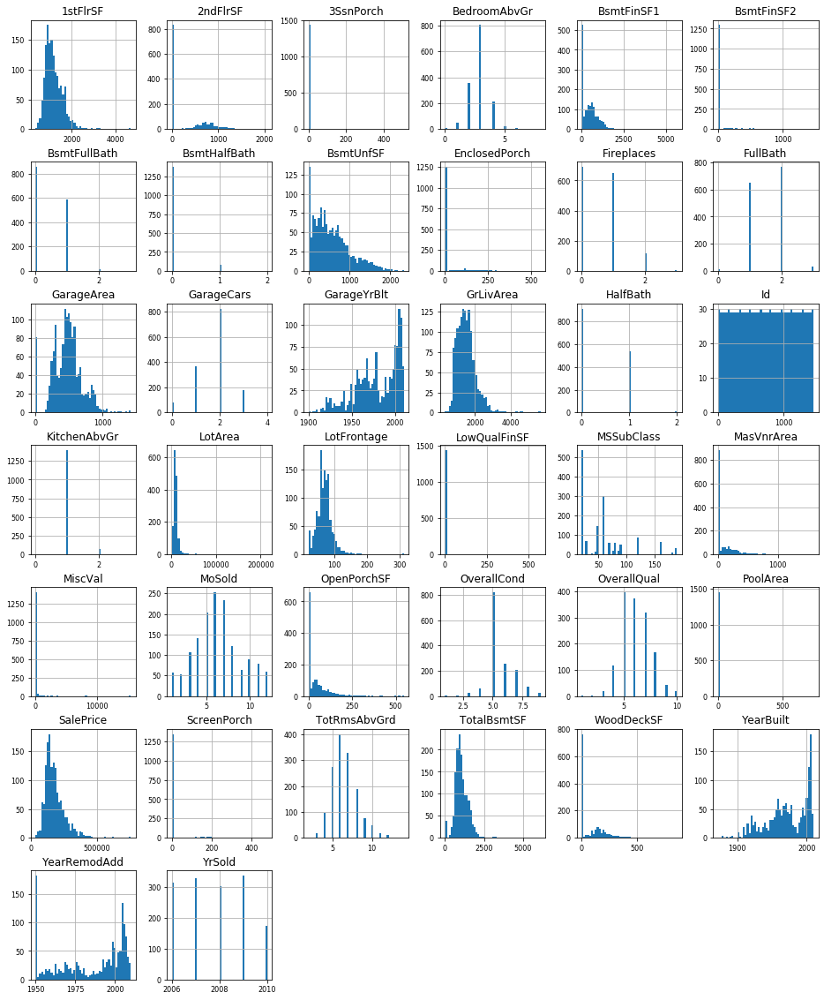

In [21]:
## Plot histograms for train data.
(data.select_dtypes(include = ['float64', 'int64'])).hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);

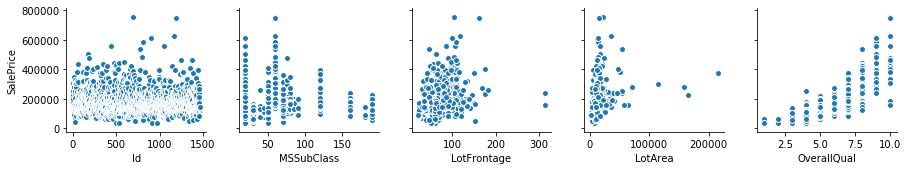

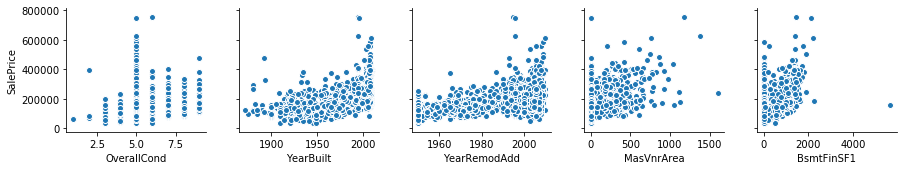

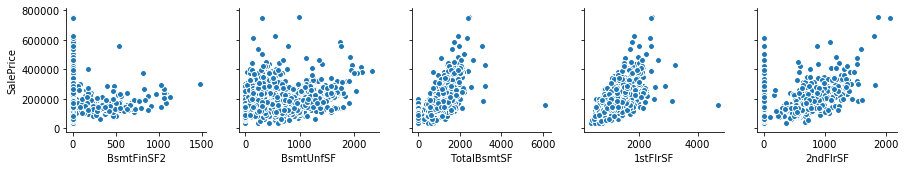

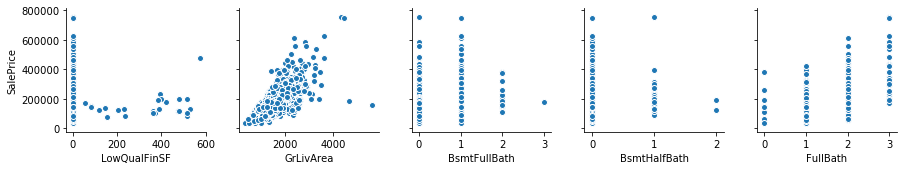

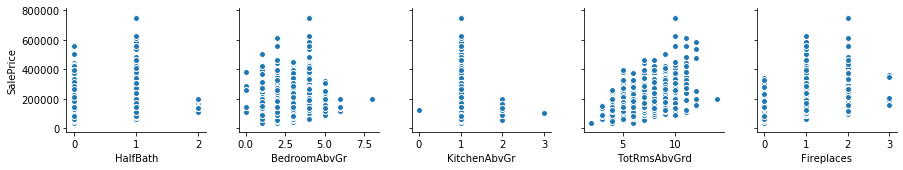

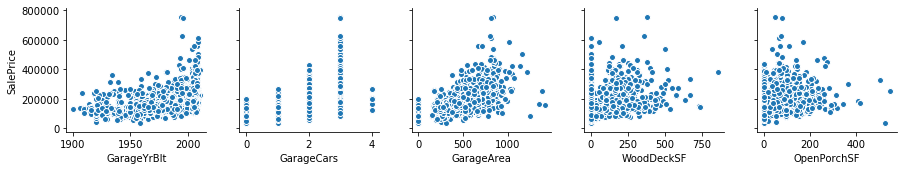

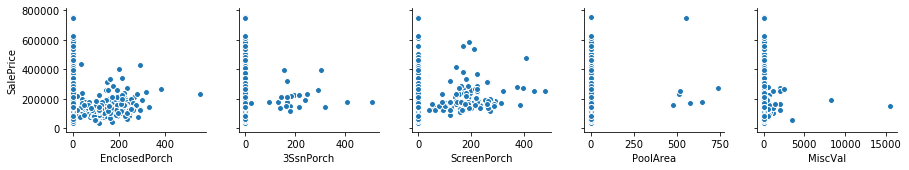

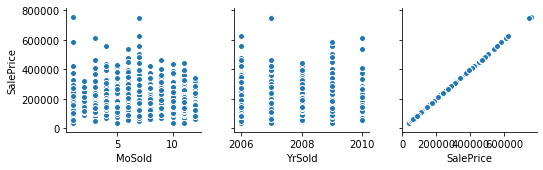

In [22]:
## Pair Plot.
temp_1 =data.select_dtypes(include = ['float64', 'int64'])
for i in range(0, len(temp_1.columns), 5):
    sns.pairplot(data=temp_1,
                x_vars=temp_1.columns[i:i+5],
                y_vars=['SalePrice'])

In [37]:
## Magic command.
%matplotlib inline

In [719]:
## Get missing values for train data.
data.isna().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [720]:
## Get missing values for test data.
test_data.isna().sum()

Id                  0
MSSubClass          0
MSZoning            4
LotFrontage       227
LotArea             0
Street              0
Alley            1352
LotShape            0
LandContour         0
Utilities           2
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         1
Exterior2nd         1
MasVnrType         16
MasVnrArea         15
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           44
BsmtCond           45
BsmtExposure       44
BsmtFinType1       42
BsmtFinSF1          1
BsmtFinType2       42
BsmtFinSF2          1
BsmtUnfSF           1
TotalBsmtSF         1
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [721]:
### Find missing values % for train data.
missing_value = (data.isna().sum()/len(data)).round(4)*100
missing_value.sort_values(ascending=False)
#missing_value.count

PoolQC           99.52
MiscFeature      96.30
Alley            93.77
Fence            80.75
FireplaceQu      47.26
LotFrontage      17.74
GarageCond        5.55
GarageType        5.55
GarageYrBlt       5.55
GarageFinish      5.55
GarageQual        5.55
BsmtExposure      2.60
BsmtFinType2      2.60
BsmtFinType1      2.53
BsmtCond          2.53
BsmtQual          2.53
MasVnrArea        0.55
MasVnrType        0.55
Electrical        0.07
Utilities         0.00
YearRemodAdd      0.00
MSSubClass        0.00
Foundation        0.00
ExterCond         0.00
ExterQual         0.00
Exterior2nd       0.00
Exterior1st       0.00
RoofMatl          0.00
RoofStyle         0.00
YearBuilt         0.00
LotConfig         0.00
OverallCond       0.00
OverallQual       0.00
HouseStyle        0.00
BldgType          0.00
Condition2        0.00
BsmtFinSF1        0.00
MSZoning          0.00
LotArea           0.00
Street            0.00
Condition1        0.00
Neighborhood      0.00
LotShape          0.00
LandContour

In [722]:
### Find missing values % for test data.
missing_value_test = (test_data.isna().sum()/len(test_data)).round(4)*100
missing_value_test.sort_values(ascending=False)

PoolQC           99.79
MiscFeature      96.50
Alley            92.67
Fence            80.12
FireplaceQu      50.03
LotFrontage      15.56
GarageCond        5.35
GarageQual        5.35
GarageYrBlt       5.35
GarageFinish      5.35
GarageType        5.21
BsmtCond          3.08
BsmtQual          3.02
BsmtExposure      3.02
BsmtFinType1      2.88
BsmtFinType2      2.88
MasVnrType        1.10
MasVnrArea        1.03
MSZoning          0.27
BsmtHalfBath      0.14
Utilities         0.14
Functional        0.14
BsmtFullBath      0.14
BsmtFinSF2        0.07
BsmtFinSF1        0.07
Exterior2nd       0.07
BsmtUnfSF         0.07
TotalBsmtSF       0.07
SaleType          0.07
Exterior1st       0.07
KitchenQual       0.07
GarageArea        0.07
GarageCars        0.07
HouseStyle        0.00
LandSlope         0.00
MSSubClass        0.00
LotArea           0.00
Street            0.00
LotShape          0.00
LandContour       0.00
LotConfig         0.00
Neighborhood      0.00
BldgType          0.00
Condition1 

In [723]:
## Method will return number of levels,null values,unique values,data types

def Observations(df):
    return(pd.DataFrame({'dtypes' : df.dtypes,
                         'levels' : [df[x].unique() for x in df.columns],
                         'null_values' : df.isna().sum(),
                         'Unique Values': df.nunique()
                        }))

## Get columns data types,number of leveel,null values,unique value for each column of train data.
Observations(data)

,dtypes,levels,null_values,Unique Values
Id,int64,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",0,1460
MSSubClass,int64,"[60, 20, 70, 50, 190, 45, 90, 120, 30, 85, 80,...",0,15
MSZoning,object,"[RL, RM, C (all), FV, RH]",0,5
LotFrontage,float64,"[65.0, 80.0, 68.0, 60.0, 84.0, 85.0, 75.0, nan...",259,110
LotArea,int64,"[8450, 9600, 11250, 9550, 14260, 14115, 10084,...",0,1073
Street,object,"[Pave, Grvl]",0,2
Alley,object,"[nan, Grvl, Pave]",1369,2
LotShape,object,"[Reg, IR1, IR2, IR3]",0,4
LandContour,object,"[Lvl, Bnk, Low, HLS]",0,4
Utilities,object,"[AllPub, NoSeWa]",0,2


In [724]:
## Get columns data types,number of leveel,null values,unique value for each column of test data.
Observations(test_data)

,dtypes,levels,null_values,Unique Values
Id,int64,"[1461, 1462, 1463, 1464, 1465, 1466, 1467, 146...",0,1459
MSSubClass,int64,"[20, 60, 120, 160, 80, 30, 50, 90, 85, 190, 45...",0,16
MSZoning,object,"[RH, RL, RM, FV, C (all), nan]",4,5
LotFrontage,float64,"[80.0, 81.0, 74.0, 78.0, 43.0, 75.0, nan, 63.0...",227,115
LotArea,int64,"[11622, 14267, 13830, 9978, 5005, 10000, 7980,...",0,1106
Street,object,"[Pave, Grvl]",0,2
Alley,object,"[nan, Pave, Grvl]",1352,2
LotShape,object,"[Reg, IR1, IR2, IR3]",0,4
LandContour,object,"[Lvl, HLS, Bnk, Low]",0,4
Utilities,object,"[AllPub, nan]",2,1


In [725]:
## Check dimensionns of train data.
data.shape

(1460, 81)

In [726]:
## Check dimesnions of test data.
test_data.shape

(1459, 80)

In [727]:
### change nan calumn names to other
#data.Alley.replace(to_replace=dict(nan='NAC'), inplace=True)

In [728]:
#data.Alley.replace(['NaN'], ['NAC'], inplace=True)

In [729]:
#data.Alley[data.Alley == 'nan'] = 'NAC' 

In [730]:
#data.Alley.replace(to_replace ="nan", value ="NAC", inplace=True) 

In [731]:
## I am replacing NA to NAA for Alley column of train data,bcz NA is having different levels meaning.
data.Alley.fillna('NAA',inplace=True)

In [732]:
## I am replacing NA to NAA for Alley column of test data,bcz NA is having different levels meaning.
test_data.Alley.fillna('NAA',inplace=True)

In [733]:
#data.Alley.replace(to_replace = np.nan, value ='NAC', inplace=True)

In [734]:
## Check unique values for Alley column of train data.
data.Alley.unique()

array(['NAA', 'Grvl', 'Pave'], dtype=object)

In [735]:
## Check unique values for Alley column of test data.
test_data.Alley.unique()

array(['NAA', 'Pave', 'Grvl'], dtype=object)

In [736]:
## Check first 5 records of train data.
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NAA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NAA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NAA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NAA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NAA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [737]:
## Fill NAs with NB value for BsmtQual column of train data.
#data.BsmtQual.replace(to_replace = np.nan, value ='NB', inplace=True)
data.BsmtQual.fillna('NB',inplace=True)

In [738]:
## Fill NAs with NB value for BsmtQual column of test data.
test_data.BsmtQual.fillna('NB',inplace=True)

In [739]:
## Fill NAs with NB value for BsmtCond column of train data.
#data.BsmtCond.replace(to_replace = np.nan, value ='NB', inplace=True)
data.BsmtCond.fillna('NB',inplace=True)

In [740]:
## Fill NAs with NB value for BsmtCond column of test data.
test_data.BsmtCond.fillna('NB',inplace=True)

In [741]:
## Fill NAs with NB value for BsmtExposure column of train data.
#data.BsmtExposure.replace(to_replace = np.nan, value ='NB', inplace=True)
data.BsmtExposure.fillna('NB',inplace=True)

In [742]:
## Fill NAs with NB value for BsmtExposure column of test data.
test_data.BsmtExposure.fillna('NB',inplace=True)

In [743]:
## Fill NAs with NB value for BsmtFinType1 column of train data.
#data.BsmtFinType1.replace(to_replace = np.nan, value ='NB', inplace=True)
data.BsmtFinType1.fillna('NB',inplace=True)

In [744]:
## Fill NAs with NB value for BsmtFinType1 column of test data.
test_data.BsmtFinType1.fillna('NB',inplace=True)

In [745]:
## Fill NAs with NB value for BsmtFinType2 column of train data.
#data.BsmtFinType2.replace(to_replace = np.nan, value ='NB', inplace=True)
data.BsmtFinType2.fillna('NB',inplace=True)

In [746]:
## Fill NAs with NB value for BsmtFinType2 column of test data.
test_data.BsmtFinType2.fillna('NB',inplace=True)

In [747]:
## Fill NAs with NF value for FireplaceQu column of train data.
#data.FireplaceQu.replace(to_replace = np.nan, value ='NF', inplace=True)
data.FireplaceQu.fillna('NF',inplace=True)

In [748]:
## Fill NAs with NF value for FireplaceQu column of test data.
test_data.FireplaceQu.fillna('NF',inplace=True)

In [749]:
## Fill NAs with NG value for GarageType column of train data.
data.GarageType.fillna('NG',inplace=True)

In [750]:
## Fill NAs with NG value for GarageType column of test data.
test_data.GarageType.fillna('NG',inplace=True)

In [751]:
## Fill NAs with NG value for GarageFinish column of train data.
data.GarageFinish.fillna('NG',inplace=True)

In [752]:
## Fill NAs with NG value for GarageFinish column of test data.
test_data.GarageFinish.fillna('NG',inplace=True)

In [753]:
## Fill NAs with NG value for GarageQual column of train data.
data.GarageQual.fillna('NG',inplace=True)

In [754]:
## Fill NAs with NG value for GarageQual column of test data.
test_data.GarageQual.fillna('NG',inplace=True)

In [755]:
## Fill NAs with NG value for GarageCond column of train data.
data.GarageCond.fillna('NG',inplace=True)

In [756]:
## Fill NAs with NG value for GarageCond column of test data.
test_data.GarageCond.fillna('NG',inplace=True)

In [757]:
## Fill NAs with NP value for PoolQC column of train data.
data.PoolQC.fillna('NP',inplace=True)

In [758]:
## Fill NAs with NP value for PoolQC column of test data.
test_data.PoolQC.fillna('NP',inplace=True)

In [759]:
## Fill NAs with NF value for Fence column of train data.
data.Fence.fillna('NF',inplace=True)

In [760]:
## Fill NAs with NF value for Fence column of test data.
test_data.Fence.fillna('NF',inplace=True)

In [761]:
## Fill NAs with NE value for MiscFeature column of train data.
data.MiscFeature.fillna('NE',inplace=True)

In [762]:
## Fill NAs with NE value for MiscFeature column of test data.
test_data.MiscFeature.fillna('NE',inplace=True)

In [763]:
## Display first record of train data.
data[:1]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NAA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NF,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NP,NF,NE,0,2,2008,WD,Normal,208500


In [764]:
## Display first record of test data.
test_data[:1]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NAA,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NF,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NP,MnPrv,NE,0,6,2010,WD,Normal


In [765]:
## Get summary statistics of train data.
Observations(data)

,dtypes,levels,null_values,Unique Values
Id,int64,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",0,1460
MSSubClass,int64,"[60, 20, 70, 50, 190, 45, 90, 120, 30, 85, 80,...",0,15
MSZoning,object,"[RL, RM, C (all), FV, RH]",0,5
LotFrontage,float64,"[65.0, 80.0, 68.0, 60.0, 84.0, 85.0, 75.0, nan...",259,110
LotArea,int64,"[8450, 9600, 11250, 9550, 14260, 14115, 10084,...",0,1073
Street,object,"[Pave, Grvl]",0,2
Alley,object,"[NAA, Grvl, Pave]",0,3
LotShape,object,"[Reg, IR1, IR2, IR3]",0,4
LandContour,object,"[Lvl, Bnk, Low, HLS]",0,4
Utilities,object,"[AllPub, NoSeWa]",0,2


In [766]:
## Get summary statistics of test data.
Observations(test_data)

,dtypes,levels,null_values,Unique Values
Id,int64,"[1461, 1462, 1463, 1464, 1465, 1466, 1467, 146...",0,1459
MSSubClass,int64,"[20, 60, 120, 160, 80, 30, 50, 90, 85, 190, 45...",0,16
MSZoning,object,"[RH, RL, RM, FV, C (all), nan]",4,5
LotFrontage,float64,"[80.0, 81.0, 74.0, 78.0, 43.0, 75.0, nan, 63.0...",227,115
LotArea,int64,"[11622, 14267, 13830, 9978, 5005, 10000, 7980,...",0,1106
Street,object,"[Pave, Grvl]",0,2
Alley,object,"[NAA, Pave, Grvl]",0,3
LotShape,object,"[Reg, IR1, IR2, IR3]",0,4
LandContour,object,"[Lvl, HLS, Bnk, Low]",0,4
Utilities,object,"[AllPub, nan]",2,1


In [767]:
## Get data type of MSZoning column.
data.MSZoning.dtypes

dtype('O')

In [771]:
## Fetch category,object data types columns from train data.
object_columns = data.select_dtypes(include=['object','category'])

In [772]:
## Fetch category,object data types columns from test data.
test_object_columns = test_data.select_dtypes(include=['object','category'])

In [773]:
## Display first records of category & object columns of train data.
object_columns.head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NAA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NF,Attchd,RFn,TA,TA,Y,NP,NF,NE,WD,Normal
1,RL,Pave,NAA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NP,NF,NE,WD,Normal
2,RL,Pave,NAA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NP,NF,NE,WD,Normal
3,RL,Pave,NAA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,NP,NF,NE,WD,Abnorml
4,RL,Pave,NAA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NP,NF,NE,WD,Normal


In [774]:
## Display first records of category & object columns of test data.
test_object_columns.head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RH,Pave,NAA,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,CBlock,TA,TA,No,Rec,LwQ,GasA,TA,Y,SBrkr,TA,Typ,NF,Attchd,Unf,TA,TA,Y,NP,MnPrv,NE,WD,Normal
1,RL,Pave,NAA,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,TA,TA,CBlock,TA,TA,No,ALQ,Unf,GasA,TA,Y,SBrkr,Gd,Typ,NF,Attchd,Unf,TA,TA,Y,NP,NF,Gar2,WD,Normal
2,RL,Pave,NAA,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Gd,Y,SBrkr,TA,Typ,TA,Attchd,Fin,TA,TA,Y,NP,MnPrv,NE,WD,Normal
3,RL,Pave,NAA,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,TA,TA,PConc,TA,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,Fin,TA,TA,Y,NP,NF,NE,WD,Normal
4,RL,Pave,NAA,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,Gable,CompShg,HdBoard,HdBoard,None,Gd,TA,PConc,Gd,TA,No,ALQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NF,Attchd,RFn,TA,TA,Y,NP,NF,NE,WD,Normal


In [775]:
## Convert object to category data type.
for col in object_columns.columns:
    data[col] = data[col].astype('str').astype('category')

In [776]:
## Get columns data types of train data.
data.dtypes

Id                  int64
MSSubClass          int64
MSZoning         category
LotFrontage       float64
LotArea             int64
Street           category
Alley            category
LotShape         category
LandContour      category
Utilities        category
LotConfig        category
LandSlope        category
Neighborhood     category
Condition1       category
Condition2       category
BldgType         category
HouseStyle       category
OverallQual         int64
OverallCond         int64
YearBuilt           int64
YearRemodAdd        int64
RoofStyle        category
RoofMatl         category
Exterior1st      category
Exterior2nd      category
MasVnrType       category
MasVnrArea        float64
ExterQual        category
ExterCond        category
Foundation       category
BsmtQual         category
BsmtCond         category
BsmtExposure     category
BsmtFinType1     category
BsmtFinSF1          int64
BsmtFinType2     category
BsmtFinSF2          int64
BsmtUnfSF           int64
TotalBsmtSF 

In [777]:
## Convert object data typpe to category.
for col in test_object_columns.columns:
    test_data[col] = test_data[col].astype('str').astype('category')

In [778]:
## Get column data types of test data.
test_data.dtypes

Id                  int64
MSSubClass          int64
MSZoning         category
LotFrontage       float64
LotArea             int64
Street           category
Alley            category
LotShape         category
LandContour      category
Utilities        category
LotConfig        category
LandSlope        category
Neighborhood     category
Condition1       category
Condition2       category
BldgType         category
HouseStyle       category
OverallQual         int64
OverallCond         int64
YearBuilt           int64
YearRemodAdd        int64
RoofStyle        category
RoofMatl         category
Exterior1st      category
Exterior2nd      category
MasVnrType       category
MasVnrArea        float64
ExterQual        category
ExterCond        category
Foundation       category
BsmtQual         category
BsmtCond         category
BsmtExposure     category
BsmtFinType1     category
BsmtFinSF1        float64
BsmtFinType2     category
BsmtFinSF2        float64
BsmtUnfSF         float64
TotalBsmtSF 

In [779]:
## Convert numeric columns into categorical varibles
cols = ['MSSubClass','OverallQual','OverallCond']
for col in cols:
    data[col] = data[col].astype('str').astype('category')

In [780]:
## Convert numeric data types to categorical data types.
for col in cols:
    test_data[col] = test_data[col].astype('str').astype('category')

In [781]:
## Get columns data types of train data.
data.dtypes

Id                  int64
MSSubClass       category
MSZoning         category
LotFrontage       float64
LotArea             int64
Street           category
Alley            category
LotShape         category
LandContour      category
Utilities        category
LotConfig        category
LandSlope        category
Neighborhood     category
Condition1       category
Condition2       category
BldgType         category
HouseStyle       category
OverallQual      category
OverallCond      category
YearBuilt           int64
YearRemodAdd        int64
RoofStyle        category
RoofMatl         category
Exterior1st      category
Exterior2nd      category
MasVnrType       category
MasVnrArea        float64
ExterQual        category
ExterCond        category
Foundation       category
BsmtQual         category
BsmtCond         category
BsmtExposure     category
BsmtFinType1     category
BsmtFinSF1          int64
BsmtFinType2     category
BsmtFinSF2          int64
BsmtUnfSF           int64
TotalBsmtSF 

In [782]:
## Get columns data types of test data.
test_data.dtypes

Id                  int64
MSSubClass       category
MSZoning         category
LotFrontage       float64
LotArea             int64
Street           category
Alley            category
LotShape         category
LandContour      category
Utilities        category
LotConfig        category
LandSlope        category
Neighborhood     category
Condition1       category
Condition2       category
BldgType         category
HouseStyle       category
OverallQual      category
OverallCond      category
YearBuilt           int64
YearRemodAdd        int64
RoofStyle        category
RoofMatl         category
Exterior1st      category
Exterior2nd      category
MasVnrType       category
MasVnrArea        float64
ExterQual        category
ExterCond        category
Foundation       category
BsmtQual         category
BsmtCond         category
BsmtExposure     category
BsmtFinType1     category
BsmtFinSF1        float64
BsmtFinType2     category
BsmtFinSF2        float64
BsmtUnfSF         float64
TotalBsmtSF 

In [783]:
## Set index for train data and display first 5 records.
data = data.set_index('Id')
data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NAA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NF,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NP,NF,NE,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,NAA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NP,NF,NE,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,NAA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NP,NF,NE,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,NAA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NP,NF,NE,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,NAA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NP,NF,NE,0,12,2008,WD,Normal,250000


In [784]:
## Set index for test data and display first 5 records.
test_data = test_data.set_index('Id')
test_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1461,20,RH,80.0,11622,Pave,NAA,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NF,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NP,MnPrv,NE,0,6,2010,WD,Normal
1462,20,RL,81.0,14267,Pave,NAA,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NF,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NP,NF,Gar2,12500,6,2010,WD,Normal
1463,60,RL,74.0,13830,Pave,NAA,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NP,MnPrv,NE,0,3,2010,WD,Normal
1464,60,RL,78.0,9978,Pave,NAA,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NP,NF,NE,0,6,2010,WD,Normal
1465,120,RL,43.0,5005,Pave,NAA,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NF,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NP,NF,NE,0,1,2010,WD,Normal


In [785]:
## Seperate numeric and categorical columns for train data.
cat_columns = data.select_dtypes(include=['category'])
num_columns = data.select_dtypes(include=['int64', 'float64'])

In [786]:
## Seperate numeric and categorical columns for test data.
test_cat_columns = test_data.select_dtypes(include=['category'])
test_num_columns = test_data.select_dtypes(include=['int64', 'float64'])

In [787]:
## Get unique values for BsmtFullBath column of train data.
data.BsmtFullBath.nunique()

4

In [788]:
## Below logic is used for checking special charcter in numeric columns(Train data).

for col in num_columns.columns:
    
    print('\n',col,'----->')
    for index in range(1,len(data)):
        try:
            skip=float(data.loc[index,col])
            skip=int(data.loc[index,col])
        except ValueError :
            print(index,data.loc[index,col])
            


 LotFrontage ----->
8 nan
13 nan
15 nan
17 nan
25 nan
32 nan
43 nan
44 nan
51 nan
65 nan
67 nan
77 nan
85 nan
96 nan
101 nan
105 nan
112 nan
114 nan
117 nan
121 nan
127 nan
132 nan
134 nan
137 nan
148 nan
150 nan
153 nan
154 nan
161 nan
167 nan
170 nan
171 nan
178 nan
181 nan
187 nan
192 nan
204 nan
208 nan
209 nan
215 nan
219 nan
222 nan
235 nan
238 nan
245 nan
250 nan
270 nan
288 nan
289 nan
294 nan
308 nan
309 nan
311 nan
320 nan
329 nan
331 nan
336 nan
343 nan
347 nan
348 nan
352 nan
357 nan
361 nan
362 nan
365 nan
367 nan
370 nan
371 nan
376 nan
385 nan
393 nan
394 nan
405 nan
406 nan
413 nan
422 nan
427 nan
448 nan
453 nan
458 nan
459 nan
460 nan
466 nan
471 nan
485 nan
491 nan
497 nan
517 nan
519 nan
530 nan
538 nan
539 nan
540 nan
542 nan
546 nan
560 nan
561 nan
565 nan
570 nan
581 nan
594 nan
611 nan
612 nan
613 nan
617 nan
624 nan
627 nan
642 nan
646 nan
661 nan
667 nan
669 nan
673 nan
680 nan
683 nan
686 nan
688 nan
691 nan
707 nan
710 nan
715 nan
721 nan
722 nan
727 nan
73

In [790]:
## Display train data numeric columns.
num_columns.columns

Index(['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [791]:
## Display test data numeric columns.
test_num_columns.columns

Index(['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold'],
      dtype='object')

In [793]:
## Check corrlation between numeric columns of train data.
data[num_columns.columns].corr()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
LotFrontage,1.000000,0.426095,0.123349,0.088866,0.193458,0.233633,0.049900,0.132644,0.392075,0.457181,0.080177,0.038469,0.402797,0.100949,-0.007234,0.198769,0.053532,0.263170,-0.006069,0.352096,0.266639,0.070250,0.285691,0.344997,0.088521,0.151972,0.010700,0.070029,0.041383,0.206167,0.003368,0.011200,0.007450,0.351799
LotArea,0.426095,1.000000,0.014228,0.013788,0.104160,0.214103,0.111170,-0.002618,0.260833,0.299475,0.050986,0.004779,0.263116,0.158155,0.048046,0.126031,0.014259,0.119690,-0.017784,0.190015,0.271364,-0.024947,0.154871,0.180403,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.263843
YearBuilt,0.123349,0.014228,1.000000,0.592855,0.315707,0.249503,-0.049107,0.149040,0.391452,0.281986,0.010308,-0.183784,0.199010,0.187599,-0.038162,0.468271,0.242656,-0.070651,-0.174800,0.095589,0.147716,0.825667,0.537850,0.478954,0.224880,0.188686,-0.387268,0.031355,-0.050364,0.004950,-0.034383,0.012398,-0.013618,0.522897
YearRemodAdd,0.088866,0.013788,0.592855,1.000000,0.179618,0.128451,-0.067759,0.181133,0.291066,0.240379,0.140024,-0.062419,0.287389,0.119470,-0.012337,0.439046,0.183331,-0.040581,-0.149598,0.191740,0.112581,0.642277,0.420622,0.371600,0.205726,0.226298,-0.193919,0.045286,-0.038740,0.005829,-0.010286,0.021490,0.035743,0.507101
MasVnrArea,0.193458,0.104160,0.315707,0.179618,1.000000,0.264736,-0.072319,0.114442,0.363936,0.344501,0.174561,-0.069071,0.390857,0.085310,0.026673,0.276833,0.201444,0.102821,-0.037610,0.280682,0.249070,0.252691,0.364204,0.373066,0.159718,0.125703,-0.110204,0.018796,0.061466,0.011723,-0.029815,-0.005965,-0.008201,0.477493
BsmtFinSF1,0.233633,0.214103,0.249503,0.128451,0.264736,1.000000,-0.050117,-0.495251,0.522396,0.445863,-0.137079,-0.064503,0.208171,0.649212,0.067418,0.058543,0.004262,-0.107355,-0.081007,0.044316,0.260011,0.153484,0.224054,0.296970,0.204306,0.111761,-0.102303,0.026451,0.062021,0.140491,0.003571,-0.015727,0.014359,0.386420
BsmtFinSF2,0.049900,0.111170,-0.049107,-0.067759,-0.072319,-0.050117,1.000000,-0.209294,0.104810,0.097117,-0.099260,0.014807,-0.009640,0.158678,0.070948,-0.076444,-0.032148,-0.015728,-0.040751,-0.035227,0.046921,-0.088011,-0.038264,-0.018227,0.067898,0.003093,0.036543,-0.029993,0.088871,0.041709,0.004940,-0.015211,0.031706,-0.011378
BsmtUnfSF,0.132644,-0.002618,0.149040,0.181133,0.114442,-0.495251,-0.209294,1.000000,0.415360,0.317987,0.004469,0.028167,0.240257,-0.422900,-0.095804,0.288886,-0.041118,0.166643,0.030086,0.250647,0.051575,0.190708,0.214175,0.183303,-0.005316,0.129005,-0.002538,0.020764,-0.012579,-0.035092,-0.023837,0.034888,-0.041258,0.214479
TotalBsmtSF,0.392075,0.260833,0.391452,0.291066,0.363936,0.522396,0.104810,0.415360,1.000000,0.819530,-0.174512,-0.033245,0.454868,0.307351,-0.000315,0.323722,-0.048804,0.050450,-0.068901,0.285573,0.339519,0.322445,0.434585,0.486665,0.232019,0.247264,-0.095478,0.037384,0.084489,0.126053,-0.018479,0.013196,-0.014969,0.613581
1stFlrSF,0.457181,0.299475,0.281986,0.240379,0.344501,0.445863,0.097117,0.317987,0.819530,1.000000,-0.202646,-0.014241,0.566024,0.244671,0.001956,0.380637,-0.119916,0.127401,0.068101,0.409516,0.410531,0.233449,0.439317,0.489782,0.235459,0.211671,-0.065292,0.056104,0.088758,0.131525,-0.021096,0.031372,-0.013604,0.605852


In [794]:
## Check corrlation between numeric columns of test data.
test_data[test_num_columns.columns].corr()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
LotFrontage,1.000000,0.644608,0.122356,0.092603,0.251533,0.204621,0.046824,0.092031,0.315802,0.461239,-0.036185,-0.037294,0.357125,0.127314,-0.042779,0.163078,0.023850,0.205100,0.016072,0.344366,0.257037,0.082069,0.336373,0.375581,0.157426,0.179795,0.013340,-0.037487,0.113444,0.134232,0.068161,0.008810,-0.025263
LotArea,0.644608,1.000000,0.048314,0.036907,0.188691,0.185470,0.054199,0.071681,0.283049,0.456417,-0.007862,-0.012457,0.366324,0.094052,-0.008378,0.147871,0.079581,0.181171,-0.031830,0.289576,0.282210,0.018330,0.263398,0.315841,0.158483,0.164815,0.099850,-0.001846,0.088712,0.140494,0.139071,0.005152,-0.051144
YearBuilt,0.122356,0.048314,1.000000,0.631696,0.312404,0.309595,-0.008174,0.111892,0.425447,0.338733,0.025195,-0.101154,0.290412,0.234922,-0.022947,0.474028,0.296700,-0.035923,-0.098644,0.134839,0.193597,0.844150,0.538428,0.482497,0.233889,0.208040,-0.363012,-0.005442,-0.031984,-0.001060,0.007325,0.015599,-0.011006
YearRemodAdd,0.092603,0.036907,0.631696,1.000000,0.213937,0.175219,-0.056320,0.148773,0.304515,0.243793,0.177177,-0.059973,0.347946,0.150371,-0.076928,0.477064,0.238807,-0.004413,-0.135940,0.203619,0.153965,0.661765,0.431442,0.382034,0.230724,0.258049,-0.243582,0.025823,-0.053761,-0.034862,0.003011,0.011771,0.029715
MasVnrArea,0.251533,0.188691,0.312404,0.213937,1.000000,0.343267,0.037546,0.064672,0.430966,0.446875,0.063659,-0.045886,0.416648,0.198270,0.003992,0.242522,0.182094,0.053259,-0.066331,0.275533,0.301575,0.257439,0.358488,0.375182,0.172721,0.163666,-0.112814,0.005772,0.069339,-0.005395,0.105723,0.005118,-0.029556
BsmtFinSF1,0.204621,0.185470,0.309595,0.175219,0.343267,1.000000,-0.059522,-0.459581,0.550444,0.470077,-0.188952,-0.068178,0.215692,0.628903,0.088971,0.104464,-0.018966,-0.119743,-0.092190,0.060346,0.326075,0.232798,0.285959,0.323800,0.242369,0.136321,-0.097441,0.088241,0.131414,0.012089,0.165403,0.013397,0.030779
BsmtFinSF2,0.046824,0.054199,-0.008174,-0.056320,0.037546,-0.059522,1.000000,-0.265183,0.076092,0.073346,-0.095935,-0.023976,-0.025137,0.166500,0.123715,-0.074858,-0.032627,-0.044951,-0.034790,-0.060361,0.083655,-0.051545,0.005806,0.022391,0.126032,-0.014185,0.029010,-0.014473,0.039806,0.050152,-0.012808,-0.003162,-0.011749
BsmtUnfSF,0.092031,0.071681,0.111892,0.148773,0.064672,-0.459581,-0.265183,1.000000,0.409023,0.275569,-0.006196,0.067212,0.226780,-0.374659,-0.117686,0.257721,-0.030584,0.199661,0.102069,0.243566,-0.043014,0.153246,0.147005,0.145625,-0.073174,0.111249,0.012468,-0.046230,-0.085111,-0.029672,0.000320,0.009132,-0.035214
TotalBsmtSF,0.315802,0.283049,0.425447,0.304515,0.430966,0.550444,0.076092,0.409023,1.000000,0.784538,-0.238633,-0.013294,0.435576,0.343680,0.024722,0.331947,-0.062711,0.056093,-0.007879,0.278408,0.326100,0.372405,0.441401,0.485558,0.227192,0.244300,-0.076275,0.039289,0.066942,0.003147,0.165227,0.021525,-0.007817
1stFlrSF,0.461239,0.456417,0.338733,0.243793,0.446875,0.470077,0.073346,0.275569,0.784538,1.000000,-0.298222,-0.011519,0.560631,0.278594,0.019899,0.365945,-0.088929,0.090188,0.084255,0.374373,0.404611,0.284615,0.441707,0.494192,0.219573,0.263813,-0.066071,0.028680,0.107902,0.112558,0.181387,0.048064,-0.013566


In [795]:
## Calculate variance for numeric columns.
def variance(x):
        return(pd.DataFrame({'Datatype' : x.dtypes,
                            'Variance': [round(x[i].var()) for i in x]
                            }))

## Get variance for numeric columns of train data.
variance(num_columns)

,Datatype,Variance
LotFrontage,float64,590
LotArea,int64,99625650
YearBuilt,int64,912
YearRemodAdd,int64,426
MasVnrArea,float64,32785
BsmtFinSF1,int64,208025
BsmtFinSF2,int64,26024
BsmtUnfSF,int64,195246
TotalBsmtSF,int64,192462
1stFlrSF,int64,149450


In [796]:
## Get variance for numeric columns of test data.
variance(test_num_columns)

,Datatype,Variance
LotFrontage,float64,501
LotArea,int64,24557152
YearBuilt,int64,924
YearRemodAdd,int64,446
MasVnrArea,float64,31551
BsmtFinSF1,float64,207269
BsmtFinSF2,float64,31242
BsmtUnfSF,float64,191197
TotalBsmtSF,float64,196159
1stFlrSF,int64,158536


In [797]:
## Drop zero variance variable from train data set.
cols = ['BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','KitchenAbvGr','Fireplaces']
data = data.drop(cols,axis=1)
num_columns = num_columns.drop(cols,axis=1)

In [798]:
## Drop zero variance variable from test data set.
test_data = test_data.drop(cols,axis=1)
test_num_columns = test_num_columns.drop(cols,axis=1)

In [799]:
## Get first record of train data after dropping few columns.
data[:1]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NAA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,3,Gd,8,Typ,NF,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NP,NF,NE,0,2,2008,WD,Normal,208500


In [800]:
## Get first record of test data after dropping few columns.
test_data[:1]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1461,20,RH,80.0,11622,Pave,NAA,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,2,TA,5,Typ,NF,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NP,MnPrv,NE,0,6,2010,WD,Normal


In [801]:
## Seperate Target and Predictors and display dimensions.

features = data.drop('SalePrice', axis = 1)
print(features.shape)
target = data['SalePrice']
print(target.shape)

(1460, 73)
(1460,)


In [802]:
## Display dimesnions of test data.
test_data.shape

(1459, 73)

In [805]:
## Split data into train and validation.
X_train,X_test,y_train,y_test=train_test_split(features,target,test_size=0.3,random_state=123)

In [807]:
## Seperate category and numeric  columns for train data.
catcols_train = X_train.select_dtypes(include=['object','category'])
numcols_train = X_train.select_dtypes(include=['int64', 'float64'])

In [808]:
## Seperate category and numeric  columns for test data.
test_catcols = test_data.select_dtypes(include=['object','category'])
test_numcols = test_data.select_dtypes(include=['int64', 'float64'])

In [809]:
## Display dimensions and column names of category and numeric columns of train data.
print(catcols_train.shape)
print(catcols_train.columns)
print(numcols_train.shape)
print(numcols_train.columns)

(1022, 46)
Index(['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu',
       'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive',
       'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition'],
      dtype='object')
(1022, 27)
Index(['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BedroomAbvGr', 'TotRmsAbvGrd',
       'GarageYrBlt', 'GarageCars', 'G

In [810]:
## Display dimensions and column names of category and numeric columns of validation data.
print(test_catcols.shape)
print(test_catcols.columns)
print(test_numcols.shape)
print(test_numcols.columns)

(1459, 46)
Index(['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu',
       'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive',
       'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition'],
      dtype='object')
(1459, 27)
Index(['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BedroomAbvGr', 'TotRmsAbvGrd',
       'GarageYrBlt', 'GarageCars', 'G

In [811]:
## Seperate category and numeric columns from test data.
catcols_test = X_test.select_dtypes(include=['object','category'])
numcols_test = X_test.select_dtypes(include=['int64', 'float64'])

In [812]:
## Display dimesniosn of test data.
catcols_test.shape

(438, 46)

In [813]:
################################################### Imputation ###############################################################

In [814]:
## Import imputer,scaler libraries for imputing null values.
from sklearn.impute import SimpleImputer

In [815]:
## Instantiate numeric ,category imputers.
num_imputer = SimpleImputer(strategy = 'median')
cat_imputer = SimpleImputer(strategy = 'most_frequent')

In [817]:
## Fit numeric imputer.
num_imputer.fit(numcols_train)

## Impute numeric columns NA values of train data and prepare data frame.
X_train_imp = num_imputer.transform(numcols_train)
X_train_imp =pd.DataFrame(X_train_imp,columns=numcols_train.columns)

In [818]:
## Check NA values for numeric columns of train data after imputing.
X_train_imp.isna().sum()

LotFrontage      0
LotArea          0
YearBuilt        0
YearRemodAdd     0
MasVnrArea       0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BedroomAbvGr     0
TotRmsAbvGrd     0
GarageYrBlt      0
GarageCars       0
GarageArea       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
MiscVal          0
MoSold           0
YrSold           0
dtype: int64

In [819]:
## Check first 5 records of numeric column of train data.
X_train_imp.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,57.0,8846.0,1996.0,1996.0,0.0,298.0,0.0,572.0,870.0,914.0,0.0,0.0,914.0,2.0,5.0,1998.0,2.0,576.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,2006.0
1,55.0,5350.0,1940.0,1966.0,0.0,0.0,0.0,728.0,728.0,1306.0,0.0,0.0,1306.0,3.0,6.0,1979.0,0.0,0.0,263.0,0.0,0.0,0.0,0.0,0.0,450.0,5.0,2010.0
2,70.0,8521.0,1967.0,1967.0,0.0,842.0,0.0,70.0,912.0,912.0,0.0,0.0,912.0,3.0,5.0,1974.0,1.0,336.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2010.0
3,84.0,8658.0,1965.0,1965.0,101.0,643.0,0.0,445.0,1088.0,1324.0,0.0,0.0,1324.0,3.0,6.0,1965.0,2.0,440.0,0.0,138.0,0.0,0.0,0.0,0.0,0.0,12.0,2006.0
4,64.0,6762.0,2007.0,2007.0,108.0,664.0,0.0,544.0,1208.0,1208.0,0.0,0.0,1208.0,2.0,6.0,2007.0,2.0,628.0,105.0,54.0,0.0,0.0,0.0,0.0,0.0,9.0,2007.0


In [820]:
## Fit category imputer.
cat_imputer.fit(catcols_train)

## Impute NA values for category columns of train data and prepares a dataframe.
X_train_imp_cat = cat_imputer.transform(catcols_train)
X_train_imp_cat = pd.DataFrame(X_train_imp_cat,columns=catcols_train.columns)

In [821]:
## Check dimesnions of category columns of train data.
X_train_imp_cat.shape

(1022, 46)

In [822]:
## Check NA values for category columns of train data after imputation.
X_train_imp_cat.isna().sum()

MSSubClass       0
MSZoning         0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinType2     0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
KitchenQual      0
Functional       0
FireplaceQu      0
GarageType       0
GarageFinish     0
GarageQual       0
GarageCond       0
PavedDrive       0
PoolQC           0
Fence            0
MiscFeature      0
SaleType         0
SaleCondition    0
dtype: int64

In [823]:
## Check first 5 records of category columns of train data.
X_train_imp_cat.head()

,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,85,RL,Pave,NAA,IR1,Lvl,AllPub,CulDSac,Gtl,CollgCr,Norm,Norm,1Fam,SFoyer,5,5,Gable,CompShg,VinylSd,VinylSd,None,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,NF,Detchd,Unf,TA,TA,Y,NP,NF,NE,WD,Normal
1,30,RL,Pave,NAA,IR1,Lvl,AllPub,Inside,Gtl,BrkSide,Norm,Norm,1Fam,1Story,3,2,Gable,CompShg,Wd Sdng,Plywood,None,TA,Po,CBlock,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,Fa,Mod,NF,NG,NG,NG,NG,Y,NP,GdWo,Shed,WD,Normal
2,20,RL,Pave,NAA,Reg,Lvl,AllPub,FR2,Gtl,Sawyer,Feedr,Norm,1Fam,1Story,5,5,Gable,CompShg,HdBoard,HdBoard,None,TA,TA,CBlock,TA,TA,No,ALQ,Unf,GasA,TA,Y,SBrkr,TA,Typ,Fa,Detchd,Unf,TA,TA,Y,NP,MnPrv,NE,WD,Normal
3,20,RL,Pave,NAA,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,TA,TA,CBlock,TA,TA,No,Rec,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NP,GdWo,NE,WD,Abnorml
4,20,RL,Pave,NAA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NF,Attchd,RFn,TA,TA,Y,NP,NF,NE,New,Partial


In [825]:
## Impute NA values for numeric columns of validation data and prepares a dataframe,display first 5 records.
X_test_imp = num_imputer.transform(numcols_test)
X_test_imp =pd.DataFrame(X_test_imp,columns=numcols_test.columns)
X_test_imp.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,68.0,9505.0,2001.0,2001.0,180.0,0.0,0.0,884.0,884.0,884.0,1151.0,0.0,2035.0,3.0,8.0,2001.0,2.0,434.0,144.0,48.0,0.0,0.0,0.0,0.0,0.0,5.0,2010.0
1,60.0,9600.0,1900.0,1950.0,0.0,0.0,0.0,1095.0,1095.0,1095.0,679.0,0.0,1774.0,4.0,8.0,1920.0,3.0,779.0,0.0,0.0,90.0,0.0,0.0,0.0,0.0,5.0,2006.0
2,32.0,3363.0,2004.0,2004.0,117.0,0.0,0.0,976.0,976.0,976.0,732.0,0.0,1708.0,3.0,7.0,2004.0,2.0,380.0,0.0,40.0,0.0,0.0,0.0,0.0,0.0,4.0,2006.0
3,75.0,9750.0,1998.0,1998.0,0.0,975.0,0.0,133.0,1108.0,1108.0,989.0,0.0,2097.0,3.0,8.0,1998.0,2.0,583.0,253.0,170.0,0.0,0.0,0.0,0.0,0.0,6.0,2006.0
4,60.0,10930.0,1945.0,1950.0,0.0,580.0,0.0,333.0,913.0,1048.0,510.0,0.0,1558.0,3.0,6.0,1962.0,1.0,288.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2008.0


In [826]:
## Check NA values for numeric columns of validation data after imputing.
X_test_imp.isna().sum()

LotFrontage      0
LotArea          0
YearBuilt        0
YearRemodAdd     0
MasVnrArea       0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BedroomAbvGr     0
TotRmsAbvGrd     0
GarageYrBlt      0
GarageCars       0
GarageArea       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
MiscVal          0
MoSold           0
YrSold           0
dtype: int64

In [827]:
## Impute NA values for category columns of validation data and prepares a dataframe and display first 5 records.
X_test_imp_cat = cat_imputer.transform(catcols_test)
X_test_imp_cat = pd.DataFrame(X_test_imp_cat,columns=catcols_test.columns)
X_test_imp_cat.head()

,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,60,RL,Pave,NAA,IR1,Lvl,AllPub,CulDSac,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,BuiltIn,Fin,TA,TA,Y,NP,NF,NE,WD,Normal
1,70,RM,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,2Story,4,2,Gable,CompShg,AsbShng,Stucco,None,TA,TA,BrkTil,TA,Fa,No,Unf,Unf,GasW,Fa,N,SBrkr,TA,Min2,NF,2Types,Unf,Fa,Fa,N,NP,NF,NE,WD,Normal
2,160,RM,Pave,NAA,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,Gd,Maj1,NF,Detchd,Unf,TA,TA,Y,NP,NF,NE,WD,Normal
3,60,RL,Pave,NAA,Reg,Lvl,AllPub,Corner,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,6,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Detchd,RFn,TA,TA,Y,NP,NF,NE,WD,Normal
4,50,RL,Pave,Grvl,Reg,Bnk,AllPub,Inside,Gtl,NAmes,Artery,Norm,1Fam,1.5Fin,5,6,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,TA,TA,No,BLQ,Unf,GasA,TA,Y,FuseA,TA,Typ,TA,Attchd,Unf,TA,TA,Y,NP,NF,NE,WD,Normal


In [828]:
## Display dimensions of category columns of validation data.
X_test_imp_cat.shape

(438, 46)

In [829]:
## Check NA values for category columns of validation data after imputation.
X_test_imp_cat.isna().sum()

MSSubClass       0
MSZoning         0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinType2     0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
KitchenQual      0
Functional       0
FireplaceQu      0
GarageType       0
GarageFinish     0
GarageQual       0
GarageCond       0
PavedDrive       0
PoolQC           0
Fence            0
MiscFeature      0
SaleType         0
SaleCondition    0
dtype: int64

In [831]:
## Impute numeric columns NA values of test data and prepare data frame,display first 5 records.
test_imp = num_imputer.transform(test_numcols)
test_imp =pd.DataFrame(test_imp,columns=test_numcols.columns)
test_imp.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,80.0,11622.0,1961.0,1961.0,0.0,468.0,144.0,270.0,882.0,896.0,0.0,0.0,896.0,2.0,5.0,1961.0,1.0,730.0,140.0,0.0,0.0,0.0,120.0,0.0,0.0,6.0,2010.0
1,81.0,14267.0,1958.0,1958.0,108.0,923.0,0.0,406.0,1329.0,1329.0,0.0,0.0,1329.0,3.0,6.0,1958.0,1.0,312.0,393.0,36.0,0.0,0.0,0.0,0.0,12500.0,6.0,2010.0
2,74.0,13830.0,1997.0,1998.0,0.0,791.0,0.0,137.0,928.0,928.0,701.0,0.0,1629.0,3.0,6.0,1997.0,2.0,482.0,212.0,34.0,0.0,0.0,0.0,0.0,0.0,3.0,2010.0
3,78.0,9978.0,1998.0,1998.0,20.0,602.0,0.0,324.0,926.0,926.0,678.0,0.0,1604.0,3.0,7.0,1998.0,2.0,470.0,360.0,36.0,0.0,0.0,0.0,0.0,0.0,6.0,2010.0
4,43.0,5005.0,1992.0,1992.0,0.0,263.0,0.0,1017.0,1280.0,1280.0,0.0,0.0,1280.0,2.0,5.0,1992.0,2.0,506.0,0.0,82.0,0.0,0.0,144.0,0.0,0.0,1.0,2010.0


In [832]:
## Check NA values for numeric columns of test data after imputing.
test_imp.isna().sum()

LotFrontage      0
LotArea          0
YearBuilt        0
YearRemodAdd     0
MasVnrArea       0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BedroomAbvGr     0
TotRmsAbvGrd     0
GarageYrBlt      0
GarageCars       0
GarageArea       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
MiscVal          0
MoSold           0
YrSold           0
dtype: int64

In [833]:
## Impute NA values for category columns of test data and prepares a dataframe,display first 5 records.
test_imp_cat = cat_imputer.transform(test_catcols)
test_imp_cat = pd.DataFrame(test_imp_cat,columns=test_catcols.columns)
test_imp_cat.head()

,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,20,RH,Pave,NAA,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,CBlock,TA,TA,No,Rec,LwQ,GasA,TA,Y,SBrkr,TA,Typ,NF,Attchd,Unf,TA,TA,Y,NP,MnPrv,NE,WD,Normal
1,20,RL,Pave,NAA,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,TA,TA,CBlock,TA,TA,No,ALQ,Unf,GasA,TA,Y,SBrkr,Gd,Typ,NF,Attchd,Unf,TA,TA,Y,NP,NF,Gar2,WD,Normal
2,60,RL,Pave,NAA,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Gd,Y,SBrkr,TA,Typ,TA,Attchd,Fin,TA,TA,Y,NP,MnPrv,NE,WD,Normal
3,60,RL,Pave,NAA,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,Gable,CompShg,VinylSd,VinylSd,BrkFace,TA,TA,PConc,TA,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,Fin,TA,TA,Y,NP,NF,NE,WD,Normal
4,120,RL,Pave,NAA,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,Gable,CompShg,HdBoard,HdBoard,None,Gd,TA,PConc,Gd,TA,No,ALQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NF,Attchd,RFn,TA,TA,Y,NP,NF,NE,WD,Normal


In [834]:
## Display dimensions of category columns of test data.
test_imp_cat.shape

(1459, 46)

In [835]:
## Check NA values for category columns of test data after imputation.
test_imp_cat.isna().sum()

MSSubClass       0
MSZoning         0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinType2     0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
KitchenQual      0
Functional       0
FireplaceQu      0
GarageType       0
GarageFinish     0
GarageQual       0
GarageCond       0
PavedDrive       0
PoolQC           0
Fence            0
MiscFeature      0
SaleType         0
SaleCondition    0
dtype: int64

In [836]:
#################################################### Standardization  ##########################################################

In [837]:
## Import Scaler library to scale the numeric values.
from sklearn.preprocessing import StandardScaler

In [838]:
## Instantiate scaler and fit a model.
scaler = StandardScaler()
scaler.fit(X_train_imp)

StandardScaler(copy=True, with_mean=True, with_std=True)

In [840]:
## Standardize numeric column values of train data,prepare a dataframe and display first 5 records.
X_train_scaler = scaler.transform(X_train_imp)
X_train_scaler = pd.DataFrame(X_train_scaler,columns=X_train_imp.columns)
X_train_scaler.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,-0.561119,-0.150083,0.842112,0.534621,-0.570667,-0.301414,-0.28229,0.009986,-0.403595,-0.628924,-0.797828,-0.1294,-1.122539,-1.03986,-0.924643,0.824828,0.333696,0.518931,-0.749421,-0.685547,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,0.232125,-1.396198
1,-0.653665,-0.505027,-0.986602,-0.914670,-0.570667,-0.932224,-0.28229,0.361595,-0.714639,0.353300,-0.797828,-0.1294,-0.394941,0.14623,-0.319271,0.046080,-2.330655,-2.190237,1.284957,-0.685547,-0.360803,-0.112837,-0.271032,-0.069193,1.343344,-0.506915,1.618941
2,0.040432,-0.183080,-0.104901,-0.866360,-0.570667,0.850133,-0.28229,-1.121474,-0.311597,-0.633935,-0.797828,-0.1294,-1.126251,0.14623,-0.924643,-0.158854,-0.998480,-0.609889,-0.749421,-0.685547,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,-0.506915,1.618941
3,0.688257,-0.169171,-0.170212,-0.962979,-0.009994,0.428887,-0.28229,-0.276260,0.073922,0.398402,-0.797828,-0.1294,-0.361531,0.14623,-0.319271,-0.527734,0.333696,-0.120733,-0.749421,1.434220,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,2.079725,-1.396198
4,-0.237207,-0.361669,1.201324,1.066028,0.028864,0.473340,-0.28229,-0.053123,0.336776,0.107744,-0.797828,-0.1294,-0.576840,-1.03986,-0.319271,1.193708,0.333696,0.763509,0.062783,0.143927,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,0.971165,-0.642413


In [842]:
## Standardize numeric column values of validation data,prepare a dataframe and display first 5 records.
X_test_scaler = scaler.transform(X_test_imp)
X_test_scaler = pd.DataFrame(X_test_scaler,columns=X_test_imp.columns)
X_test_scaler.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,-0.052114,-0.083176,1.005390,0.776169,0.428552,-0.932224,-0.28229,0.713204,-0.372929,-0.704094,1.847518,-0.1294,0.958169,0.146230,0.891472,0.947788,0.333696,-0.148954,0.364459,0.051763,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,-0.506915,1.618941
1,-0.422299,-0.073531,-2.292826,-1.687625,-0.570667,-0.932224,-0.28229,1.188778,0.089255,-0.175397,0.762719,-0.1294,0.473722,1.332321,0.891472,-2.372137,1.665871,1.473725,-0.749421,-0.685547,1.088712,-0.112837,-0.271032,-0.069193,-0.108754,-0.506915,-1.396198
2,-1.717949,-0.706764,1.103357,0.921098,0.078825,-0.932224,-0.28229,0.920563,-0.171408,-0.473572,0.884529,-0.1294,0.351219,0.146230,0.286100,1.070748,0.333696,-0.402938,-0.749421,-0.071122,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,-0.876435,-1.396198
3,0.271798,-0.058301,0.907423,0.631240,-0.570667,1.131669,-0.28229,-0.979478,0.117731,-0.142823,1.475193,-0.1294,1.073249,0.146230,0.891472,0.824828,0.333696,0.551855,1.207604,1.925761,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,-0.137395,-1.396198
4,-0.422299,0.061502,-0.823324,-1.687625,-0.570667,0.295527,-0.28229,-0.528697,-0.309406,-0.293164,0.374306,-0.1294,0.072801,0.146230,-0.319271,-0.650694,-0.998480,-0.835653,-0.749421,-0.685547,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,-0.876435,0.111371


In [844]:
## Standardize numeric column values of test data,prepare a dataframe and display first 5 records.
test_scaler = scaler.transform(test_imp)
test_scaler = pd.DataFrame(test_scaler,columns=test_imp.columns)
test_scaler.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,0.503164,0.131760,-0.300834,-1.156218,-0.570667,0.058444,0.595815,-0.670693,-0.377310,-0.674026,-0.797828,-0.1294,-1.155949,-1.03986,-0.924643,-0.691681,-0.998480,1.243258,0.333518,-0.685547,-0.360803,-0.112837,1.843566,-0.069193,-0.108754,-0.137395,1.618941
1,0.549437,0.400303,-0.398801,-1.301147,0.028864,1.021594,-0.282290,-0.364162,0.601820,0.410930,-0.797828,-0.1294,-0.352250,0.14623,-0.319271,-0.814641,-0.998480,-0.722771,2.290543,-0.132564,-0.360803,-0.112837,-0.271032,-0.069193,40.227307,-0.137395,1.618941
2,0.225525,0.355935,0.874768,0.631240,-0.570667,0.742175,-0.282290,-0.970462,-0.276549,-0.593844,0.813282,-0.1294,0.204585,0.14623,-0.319271,0.783841,0.333696,0.076810,0.890458,-0.163286,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,-1.245955,1.618941
3,0.410618,-0.035153,0.907423,0.631240,-0.459643,0.342097,-0.282290,-0.548982,-0.280930,-0.598856,0.760421,-0.1294,0.158182,0.14623,0.286100,0.824828,0.333696,0.020369,2.035278,-0.132564,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,-0.137395,1.618941
4,-1.208944,-0.540054,0.711490,0.341382,-0.570667,-0.375502,-0.282290,1.012973,0.494488,0.288152,-0.797828,-0.1294,-0.443200,-1.03986,-0.924643,0.578907,0.333696,0.189692,-0.749421,0.574025,-0.360803,-0.112837,2.266486,-0.069193,-0.108754,-1.984995,1.618941


In [845]:
## Combine numeric  and category columns of train data and display dimesions of result dataframe.
train_result = ""
train_result = pd.concat([X_train_scaler, X_train_imp_cat], axis=1)
train_result.shape

(1022, 73)

In [846]:
## Check first 5 records of train data.
train_result.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,-0.561119,-0.150083,0.842112,0.534621,-0.570667,-0.301414,-0.28229,0.009986,-0.403595,-0.628924,-0.797828,-0.1294,-1.122539,-1.03986,-0.924643,0.824828,0.333696,0.518931,-0.749421,-0.685547,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,0.232125,-1.396198,85,RL,Pave,NAA,IR1,Lvl,AllPub,CulDSac,Gtl,CollgCr,Norm,Norm,1Fam,SFoyer,5,5,Gable,CompShg,VinylSd,VinylSd,None,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,NF,Detchd,Unf,TA,TA,Y,NP,NF,NE,WD,Normal
1,-0.653665,-0.505027,-0.986602,-0.914670,-0.570667,-0.932224,-0.28229,0.361595,-0.714639,0.353300,-0.797828,-0.1294,-0.394941,0.14623,-0.319271,0.046080,-2.330655,-2.190237,1.284957,-0.685547,-0.360803,-0.112837,-0.271032,-0.069193,1.343344,-0.506915,1.618941,30,RL,Pave,NAA,IR1,Lvl,AllPub,Inside,Gtl,BrkSide,Norm,Norm,1Fam,1Story,3,2,Gable,CompShg,Wd Sdng,Plywood,None,TA,Po,CBlock,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,Fa,Mod,NF,NG,NG,NG,NG,Y,NP,GdWo,Shed,WD,Normal
2,0.040432,-0.183080,-0.104901,-0.866360,-0.570667,0.850133,-0.28229,-1.121474,-0.311597,-0.633935,-0.797828,-0.1294,-1.126251,0.14623,-0.924643,-0.158854,-0.998480,-0.609889,-0.749421,-0.685547,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,-0.506915,1.618941,20,RL,Pave,NAA,Reg,Lvl,AllPub,FR2,Gtl,Sawyer,Feedr,Norm,1Fam,1Story,5,5,Gable,CompShg,HdBoard,HdBoard,None,TA,TA,CBlock,TA,TA,No,ALQ,Unf,GasA,TA,Y,SBrkr,TA,Typ,Fa,Detchd,Unf,TA,TA,Y,NP,MnPrv,NE,WD,Normal
3,0.688257,-0.169171,-0.170212,-0.962979,-0.009994,0.428887,-0.28229,-0.276260,0.073922,0.398402,-0.797828,-0.1294,-0.361531,0.14623,-0.319271,-0.527734,0.333696,-0.120733,-0.749421,1.434220,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,2.079725,-1.396198,20,RL,Pave,NAA,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,TA,TA,CBlock,TA,TA,No,Rec,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NP,GdWo,NE,WD,Abnorml
4,-0.237207,-0.361669,1.201324,1.066028,0.028864,0.473340,-0.28229,-0.053123,0.336776,0.107744,-0.797828,-0.1294,-0.576840,-1.03986,-0.319271,1.193708,0.333696,0.763509,0.062783,0.143927,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,0.971165,-0.642413,20,RL,Pave,NAA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NF,Attchd,RFn,TA,TA,Y,NP,NF,NE,New,Partial


In [847]:
## Check NA values for train data.
train_result.isna().sum()

LotFrontage      0
LotArea          0
YearBuilt        0
YearRemodAdd     0
MasVnrArea       0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BedroomAbvGr     0
TotRmsAbvGrd     0
GarageYrBlt      0
GarageCars       0
GarageArea       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
MiscVal          0
MoSold           0
YrSold           0
MSSubClass       0
MSZoning         0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond    

In [848]:
## Prepare a dataframe with train data.
dataframe1 = pd.DataFrame(train_result)

In [849]:
## Copy dataframe data into a CSV file.
dataframe1.to_csv('TrainDataPreprocess.csv',index=False)

In [850]:
## Combine numeric  and category columns of validation data.
test_result = ""
test_result = pd.concat([X_test_scaler, X_test_imp_cat], axis=1)

In [851]:
## Check dimesions of validation data.
test_result.shape

(438, 73)

In [852]:
## Get first 5 records of validation data.
test_result.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,-0.052114,-0.083176,1.005390,0.776169,0.428552,-0.932224,-0.28229,0.713204,-0.372929,-0.704094,1.847518,-0.1294,0.958169,0.146230,0.891472,0.947788,0.333696,-0.148954,0.364459,0.051763,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,-0.506915,1.618941,60,RL,Pave,NAA,IR1,Lvl,AllPub,CulDSac,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,BuiltIn,Fin,TA,TA,Y,NP,NF,NE,WD,Normal
1,-0.422299,-0.073531,-2.292826,-1.687625,-0.570667,-0.932224,-0.28229,1.188778,0.089255,-0.175397,0.762719,-0.1294,0.473722,1.332321,0.891472,-2.372137,1.665871,1.473725,-0.749421,-0.685547,1.088712,-0.112837,-0.271032,-0.069193,-0.108754,-0.506915,-1.396198,70,RM,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,2Story,4,2,Gable,CompShg,AsbShng,Stucco,None,TA,TA,BrkTil,TA,Fa,No,Unf,Unf,GasW,Fa,N,SBrkr,TA,Min2,NF,2Types,Unf,Fa,Fa,N,NP,NF,NE,WD,Normal
2,-1.717949,-0.706764,1.103357,0.921098,0.078825,-0.932224,-0.28229,0.920563,-0.171408,-0.473572,0.884529,-0.1294,0.351219,0.146230,0.286100,1.070748,0.333696,-0.402938,-0.749421,-0.071122,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,-0.876435,-1.396198,160,RM,Pave,NAA,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,Gd,Maj1,NF,Detchd,Unf,TA,TA,Y,NP,NF,NE,WD,Normal
3,0.271798,-0.058301,0.907423,0.631240,-0.570667,1.131669,-0.28229,-0.979478,0.117731,-0.142823,1.475193,-0.1294,1.073249,0.146230,0.891472,0.824828,0.333696,0.551855,1.207604,1.925761,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,-0.137395,-1.396198,60,RL,Pave,NAA,Reg,Lvl,AllPub,Corner,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,6,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Detchd,RFn,TA,TA,Y,NP,NF,NE,WD,Normal
4,-0.422299,0.061502,-0.823324,-1.687625,-0.570667,0.295527,-0.28229,-0.528697,-0.309406,-0.293164,0.374306,-0.1294,0.072801,0.146230,-0.319271,-0.650694,-0.998480,-0.835653,-0.749421,-0.685547,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,-0.876435,0.111371,50,RL,Pave,Grvl,Reg,Bnk,AllPub,Inside,Gtl,NAmes,Artery,Norm,1Fam,1.5Fin,5,6,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,TA,TA,No,BLQ,Unf,GasA,TA,Y,FuseA,TA,Typ,TA,Attchd,Unf,TA,TA,Y,NP,NF,NE,WD,Normal


In [853]:
## Check NA values for validation data after combining numeric and category columns.
test_result.isna().sum()

LotFrontage      0
LotArea          0
YearBuilt        0
YearRemodAdd     0
MasVnrArea       0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BedroomAbvGr     0
TotRmsAbvGrd     0
GarageYrBlt      0
GarageCars       0
GarageArea       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
MiscVal          0
MoSold           0
YrSold           0
MSSubClass       0
MSZoning         0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond    

In [854]:
## Prepare dataframe with validation data.
dataframe2 = pd.DataFrame(test_result)

In [855]:
## Copy dataframe data into a CSV file.
dataframe2.to_csv('ValidationDataPreprocess.csv',index=False)

In [856]:
## Prepare a dataframe with target column data of train.
dataframe3 = pd.DataFrame(y_train)

In [857]:
## Copy dataframe data into a CSV file.
dataframe3.to_csv('TrainTarget.csv',index=False)

In [858]:
## Prepare a dataframe with target column data of validation.
dataframe4 = pd.DataFrame(y_test)

In [859]:
## Copy dataframe data into a CSV file.
dataframe4.to_csv('ValidationTarget.csv',index=False)

In [860]:
################################################## Dummification###############################################################

In [862]:
## Display category column levels of train data.
for i in X_train_imp_cat:
    print(i , X_train_imp_cat[i].nunique())

MSSubClass 15
MSZoning 5
Street 2
Alley 3
LotShape 4
LandContour 4
Utilities 2
LotConfig 5
LandSlope 3
Neighborhood 25
Condition1 9
Condition2 8
BldgType 5
HouseStyle 8
OverallQual 10
OverallCond 9
RoofStyle 6
RoofMatl 7
Exterior1st 13
Exterior2nd 16
MasVnrType 5
ExterQual 4
ExterCond 5
Foundation 6
BsmtQual 5
BsmtCond 5
BsmtExposure 5
BsmtFinType1 7
BsmtFinType2 7
Heating 5
HeatingQC 5
CentralAir 2
Electrical 6
KitchenQual 4
Functional 6
FireplaceQu 6
GarageType 7
GarageFinish 4
GarageQual 6
GarageCond 6
PavedDrive 3
PoolQC 4
Fence 5
MiscFeature 4
SaleType 9
SaleCondition 6


In [863]:
## Display dimensions of train data.
X_train_imp_cat.shape

(1022, 46)

In [864]:
## Get dummies for category columns of train data,display dimesnionns and first 5 records.
catcols_train_dummy = pd.get_dummies(columns = X_train_imp_cat.columns, data = X_train_imp_cat, drop_first= True)
print(catcols_train_dummy.shape)
catcols_train_dummy.head()

(1022, 250)


,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NAA,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_10,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,...,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NB,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NB,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NB,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NB,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NB,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Electrical_nan,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NF,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NG,GarageFinish_NG,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_NG,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NG,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Fa,PoolQC_Gd,PoolQC_NP,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_NF,MiscFeature_NE,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0,0,1,

In [866]:
## Display category column levels of validation data.
for i in X_test_imp_cat:
    print(i , X_test_imp_cat[i].nunique())

MSSubClass 15
MSZoning 4
Street 2
Alley 3
LotShape 4
LandContour 4
Utilities 1
LotConfig 5
LandSlope 3
Neighborhood 25
Condition1 8
Condition2 2
BldgType 5
HouseStyle 8
OverallQual 8
OverallCond 8
RoofStyle 5
RoofMatl 5
Exterior1st 14
Exterior2nd 14
MasVnrType 5
ExterQual 4
ExterCond 4
Foundation 6
BsmtQual 5
BsmtCond 4
BsmtExposure 5
BsmtFinType1 7
BsmtFinType2 7
Heating 5
HeatingQC 4
CentralAir 2
Electrical 4
KitchenQual 4
Functional 7
FireplaceQu 6
GarageType 7
GarageFinish 4
GarageQual 6
GarageCond 6
PavedDrive 3
PoolQC 3
Fence 5
MiscFeature 4
SaleType 6
SaleCondition 6


In [867]:
## Display dimesnions of category columns of validation data.
X_test_imp_cat.shape

(438, 46)

In [872]:
## Get dummies for category columns of train data,display dimesnionns and first 5 records.
catcols_test_dummy = pd.get_dummies(columns = X_test_imp_cat.columns, data = X_test_imp_cat, drop_first= True)
print(catcols_test_dummy.shape)
catcols_test_dummy.head()

(438, 226)


,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NAA,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNn,Condition2_Norm,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Gable,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Metal,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,...,MasVnrType_nan,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NB,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NB,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NB,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NB,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NB,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NF,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NG,GarageFinish_NG,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_NG,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NG,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Gd,PoolQC_NP,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_NF,MiscFeature_NE,MiscFeature_Othr,MiscFeature_Shed,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0
1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [873]:
#train_levels,test_levels = catcols_train_dummy.align(catcols_test_dummy, join='outer', axis=1, fill_value=0)

In [877]:
## Get missing columns in the validation data test.
missing_cols = set( catcols_train_dummy.columns ) - set( catcols_test_dummy.columns )
## Add a missing column in test set with default value equal to 0.
for c in missing_cols:
    catcols_test_dummy[c] = 0
catcols_test_dummy = catcols_test_dummy[catcols_train_dummy.columns]

In [878]:
## Display dimensions of category columns of train data.
catcols_train_dummy.shape

(1022, 250)

In [879]:
## Display dimensions of category columns of validation data.
catcols_test_dummy.shape

(438, 250)

In [881]:
## Combine numeric and category columns of train data.
train_data_final = pd.concat([X_train_scaler, catcols_train_dummy], axis=1)

In [882]:
## Check dimesnions of train data.
train_data_final.shape

(1022, 277)

In [883]:
## Check dimesnions of target varible of train data.
y_train.shape

(1022,)

In [884]:
## Check first 5 records of train ata.
train_data_final.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NAA,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,...,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NB,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NB,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NB,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NB,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NB,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Electrical_nan,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NF,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NG,GarageFinish_NG,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_NG,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NG,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Fa,PoolQC_Gd,PoolQC_NP,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_NF,MiscFeature_NE,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,-0.561119,-0.150083,0.842112,0.534621,-0.570667,-0.301414,-0.28229,0.009986,-0.403595,-0.628924,-0.797828,-0.1294,-1.122539,-1.03986,-0.924643,0.824828,0.333696,0.518931,-0.749421,-0.685547,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,0.232125,-1.396198,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,-0.653665,-0.505027,-0.986602,-0.914670,-0.570667,-0.932224,-0.28229,0.361595,-0.714639,0.353300,-0.797828,-0.1294,-0.394941,0.14623,-0.319271,0.046080,-2.330655,-2.190237,1.284957,-0.685547,-0.360803,-0.112837,-0.271032,-0.069193,1.343344,-0.506915,1.618941,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1

In [885]:
## Combine numeric and category columns of validation data.
test_data_final = pd.concat([X_test_scaler, catcols_test_dummy], axis=1)

In [886]:
## Display dimensions of validation data.
test_data_final.shape

(438, 277)

In [887]:
## Get first 5 records of validation data.
test_data_final.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NAA,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,...,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NB,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NB,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NB,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NB,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NB,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Electrical_nan,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NF,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NG,GarageFinish_NG,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_NG,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NG,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Fa,PoolQC_Gd,PoolQC_NP,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_NF,MiscFeature_NE,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,-0.052114,-0.083176,1.005390,0.776169,0.428552,-0.932224,-0.28229,0.713204,-0.372929,-0.704094,1.847518,-0.1294,0.958169,0.146230,0.891472,0.947788,0.333696,-0.148954,0.364459,0.051763,-0.360803,-0.112837,-0.271032,-0.069193,-0.108754,-0.506915,1.618941,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,-0.422299,-0.073531,-2.292826,-1.687625,-0.570667,-0.932224,-0.28229,1.188778,0.089255,-0.175397,0.762719,-0.1294,0.473722,1.332321,0.891472,-2.372137,1.665871,1.473725,-0.749421,-0.685547,1.088712,-0.112837,-0.271032,-0.069193,-0.108754,-0.506915,-1.396198,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0

In [889]:
## Display category columns levels of test data.
for i in test_imp_cat:
    print(i , test_imp_cat[i].nunique())

MSSubClass 16
MSZoning 6
Street 2
Alley 3
LotShape 4
LandContour 4
Utilities 2
LotConfig 5
LandSlope 3
Neighborhood 25
Condition1 9
Condition2 5
BldgType 5
HouseStyle 7
OverallQual 10
OverallCond 9
RoofStyle 6
RoofMatl 4
Exterior1st 14
Exterior2nd 16
MasVnrType 5
ExterQual 4
ExterCond 5
Foundation 6
BsmtQual 5
BsmtCond 5
BsmtExposure 5
BsmtFinType1 7
BsmtFinType2 7
Heating 4
HeatingQC 5
CentralAir 2
Electrical 4
KitchenQual 5
Functional 8
FireplaceQu 6
GarageType 7
GarageFinish 4
GarageQual 5
GarageCond 6
PavedDrive 3
PoolQC 3
Fence 5
MiscFeature 4
SaleType 10
SaleCondition 6


In [890]:
## Check dimensions of category columns of test data before doing dummification.
test_imp_cat.shape

(1459, 46)

In [899]:
## Get dummies for category columns of test data,display dimesnionns and first 5 records.
test_catcols_dummy = pd.get_dummies(columns = test_imp_cat.columns, data = test_imp_cat, drop_first= True)
print(test_catcols_dummy.shape)
test_catcols_dummy.head()

(1459, 245)


,MSSubClass_150,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,MSZoning_nan,Street_Pave,Alley_NAA,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_nan,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_10,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Gable,...,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NB,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NB,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NB,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NB,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NB,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasW,Heating_Grav,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,KitchenQual_nan,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,Functional_nan,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NF,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NG,GarageFinish_NG,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Gd,GarageQual_NG,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NG,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Gd,PoolQC_NP,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_NF,MiscFeature_NE,MiscFeature_Othr,MiscFeature_Shed,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleType_nan,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,...,1,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,...,1,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,

In [904]:
## Get missing columns in the test data set.
missing_cols = set( catcols_train_dummy.columns ) - set( test_catcols_dummy.columns )
## Add a missing column in test set with default value equal to 0.
for c in missing_cols:
    test_catcols_dummy[c] = 0
test_catcols_dummy = test_catcols_dummy[catcols_train_dummy.columns]

In [906]:
## Check dimesnions of categoory columns of test data.
test_catcols_dummy.shape

(1459, 250)

In [907]:
## Combine cateory and numeric columns of test data.
test_data_combine = pd.concat([test_scaler, test_catcols_dummy], axis=1)

In [139]:
############################################### Decision Tree ##################################################################

In [909]:
## Import decision tree model.
from sklearn.tree import DecisionTreeRegressor

In [910]:
## Instantiate and fit a regression model.
dtr = DecisionTreeRegressor(max_depth=5,min_samples_leaf=10,min_samples_split=5,random_state=123)
dtr.fit(train_data_final,y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=5,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=10, min_samples_split=5,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=123, splitter='best')

In [911]:
## Get the predictions on train and validation data.
pred_train = dtr.predict(train_data_final)
pred_test = dtr.predict(test_data_final)

In [912]:
## Get predictions for test data.
test_pred = dtr.predict(test_data_combine)

In [932]:
## Check dimensions of test data index column.
test_data.index.shape

(1459,)

In [933]:
## Check dimesnions of test predictions data.
test_pred.shape

(1459,)

In [935]:
## Prepare a dataframe with test data index,prediction values.
dataframe5 = pd.DataFrame({'Id' : test_data.index,
                          'SalePrice' : test_pred})

In [936]:
## Copy dataframe data into a CSV file.
dataframe5.to_csv('PredictionValues.csv',index=False)

In [913]:
## Import error metric libraries to measure RMSE.
from sklearn.metrics import mean_squared_error
from math import sqrt

In [914]:
## Display train and validation RMSE.
print("Train Error:",sqrt(mean_squared_error(y_train, pred_train)))
print("Test Error:",sqrt(mean_squared_error(y_test, pred_test)))

Train Error: 35145.50572611597
Test Error: 37672.08587542323


In [193]:
############################################## Random Forest ##################################################################

In [1]:
## Import random forest regressor model.
from sklearn.ensemble import RandomForestRegressor

In [938]:
## Instantiate a regressor model.
rc = RandomForestRegressor(n_estimators= 25, max_depth= 10)## ,min_samples_leaf = 2)## ,max_features='sqrt')

In [939]:
## Fit a model.
rc.fit(train_data_final,y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=10, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=25, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [940]:
## Get the predictions on train and validation data.
pred_train = rc.predict(train_data_final)
pred_test = rc.predict(test_data_final)

In [941]:
## Get predictions on test data.
test_pred = rc.predict(test_data_combine)

In [942]:
## Prepare a dataframe with test data index,prediction values.
dataframe6 = pd.DataFrame({'Id' : test_data.index,
                          'SalePrice' : test_pred})

In [944]:
## Copy dataframe data into a CSV file.
dataframe6.to_csv('PredictionValues.csv',index=False)

In [945]:
## Display RMSE values for train and validation data.
print("Train Error:",sqrt(mean_squared_error(y_train, pred_train)))
print("Test Error:",sqrt(mean_squared_error(y_test, pred_test)))

Train Error: 14189.808357485022
Test Error: 28007.627868664316


In [ ]:
################################################### AdaBoost ##################################################################

In [294]:
## Import adaboost regressor model.
from sklearn.ensemble import AdaBoostRegressor

In [310]:
## Instantiate regressor model and fit it.
Adaboost_model = AdaBoostRegressor(n_estimators=50,learning_rate=1)
%time Adaboost_model.fit(train_data_final, y_train)

Wall time: 424 ms


AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=None)

In [311]:
## Get the predictions on train and validation data.
pred_train = Adaboost_model.predict(train_data_final)
pred_test = Adaboost_model.predict(test_data_final)

In [ ]:
## Get predictions on test data.
test_pred = Adaboost_model.predict(test_data_combine)

In [312]:
## Display RMSE value for train and validation data.
print("Train Error:",sqrt(mean_squared_error(y_train, pred_train)))
print("Test Error:",sqrt(mean_squared_error(y_test, pred_test)))

Train Error: 30520.585335079977
Test Error: 36586.41368072027


In [ ]:
##################################################### GradientBoosting #########################################################

In [313]:
## Import Graident boot model library.
from sklearn.ensemble import GradientBoostingRegressor

In [360]:
## Innstantiate GBR and fit it.
gbm = GradientBoostingRegressor(n_estimators=50,learning_rate=0.8,random_state=474)
%time gbm.fit(X=train_data_final, y=y_train)

Wall time: 318 ms


GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.8, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=474, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [361]:
## Get the predictions on train and validation.
pred_train = gbm.predict(train_data_final)
pred_test = gbm.predict(test_data_final)

In [ ]:
## Get predictions on test data.
test_pred = gbm.predict(test_data_combine)

In [362]:
## Dispay RMSE value for train and validation.
print("Train Error:",sqrt(mean_squared_error(y_train, pred_train)))
print("Test Error:",sqrt(mean_squared_error(y_test, pred_test)))

Train Error: 8570.43403879048
Test Error: 30745.40731980334


In [363]:
################################################## XGradient Boosting ##########################################################

In [2]:
## Import XGBoost model library.
import xgboost as xgb
from xgboost.sklearn import XGBRegressor

In [948]:
## Instantiate XGBR and fit it.
xgb_model=XGBRegressor(n_estimators=100,learning_rate=0.8)
%time xgb_model.fit(train_data_final,y_train,verbose=True)

C:\Users\nagar\Anaconda3\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[00:56:41] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Wall time: 1.42 s


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.8, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [949]:
## Get the predictions on train and validation.
pred_train = xgb_model.predict(train_data_final)
pred_test = xgb_model.predict(test_data_final)

In [950]:
## Get predictions on test data.
test_pred = xgb_model.predict(test_data_combine)

In [951]:
## Prepare a dataframe with test inndex,preidction values.
dataframe7 = pd.DataFrame({'Id' : test_data.index,
                          'SalePrice' : test_pred})

In [952]:
## Copy dataframe data into a CSV file.
dataframe7.to_csv('PredictionValues.csv',index=False)

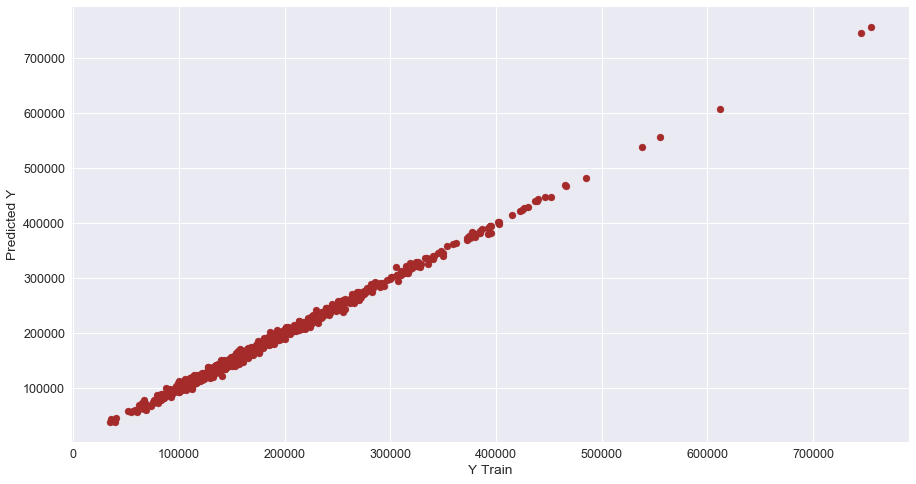

In [971]:
## Display scatter plot for actual target and prediction values.
plt.figure(figsize=(15,8))
plt.scatter(y_train,pred_train, c= 'brown')
plt.xlabel('Y Train')
plt.ylabel('Predicted Y')
plt.show()

In [953]:
## Get RMSE value for train and validation data.
print("Train Error:",sqrt(mean_squared_error(y_train, pred_train)))
print("Test Error:",sqrt(mean_squared_error(y_test, pred_test)))

Train Error: 4641.200474416745
Test Error: 32621.566438550162


In [391]:
#################################################### SVM #######################################################################

In [395]:
## Import SVR model library.
from sklearn.svm import SVR

In [396]:
## Instantiate SVR model.
svr_model = SVR()
svr_model

SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [399]:
## Fit a model.
svr_model.fit(X = train_data_final, y = y_train)

SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [400]:
## Get the predictions on train and validation.
pred_train = svr_model.predict(train_data_final)
pred_test = svr_model.predict(test_data_final)

In [ ]:
## Get predictions on test data.
test_pred = svr_model.predict(test_data_combine)

In [401]:
## Get predictions on test data.
print("Train Error:",sqrt(mean_squared_error(y_train, pred_train)))
print("Test Error:",sqrt(mean_squared_error(y_test, pred_test)))

Train Error: 83315.89848130586
Test Error: 79142.24398988248


In [ ]:
################################################### KNN #######################################################################

In [537]:
## Import KNN model library.
from sklearn.neighbors import KNeighborsRegressor

In [548]:
## Instantiate KNN model and fit it.
knn = KNeighborsRegressor(algorithm = 'brute', n_neighbors = 4,
                           metric = "euclidean")
knn.fit(train_data_final, y_train)

KNeighborsRegressor(algorithm='brute', leaf_size=30, metric='euclidean',
                    metric_params=None, n_jobs=None, n_neighbors=4, p=2,
                    weights='uniform')

In [549]:
## Get the predictions on train and validation.
pred_train = knn.predict(train_data_final)
pred_test = knn.predict(test_data_final)

In [ ]:
## Get predictions on test data.
test_pred = knn.predict(test_data_combine)

In [550]:
## Display RMSE values fo train and validation.
print("Train Error:",sqrt(mean_squared_error(y_train, pred_train)))
print("Test Error:",sqrt(mean_squared_error(y_test, pred_test)))

Train Error: 31531.213116588428
Test Error: 37136.77105383857


In [551]:
############################################# Neural Network Linear Algoritham #################################################

In [3]:
## Import Sequential,Dense model libraries.
from keras.models import Sequential
from keras.layers import Dense

C:\Users\nagar\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [562]:
## Instantiate squential model.
model = Sequential()

## Add dense model.
model.add(Dense(1, input_dim=train_data_final.shape[1]))

## Add compiler to model.
model.compile(loss='mse', optimizer='rmsprop')

## Fit a model.
model.fit(train_data_final, y_train, epochs=150, batch_size=32)

Epoch 1/150
1022/1022 [==============================] - 0s 184us/step - loss: 38950132341.2290
Epoch 2/150
1022/1022 [==============================] - 0s 65us/step - loss: 38949634272.4384
Epoch 3/150
1022/1022 [==============================] - 0s 73us/step - loss: 38949164879.6556
Epoch 4/150
1022/1022 [==============================] - 0s 65us/step - loss: 38948694541.0254
Epoch 5/150
1022/1022 [==============================] - 0s 63us/step - loss: 38948221424.9706
Epoch 6/150
1022/1022 [==============================] - 0s 62us/step - loss: 38947748821.9178
Epoch 7/150
1022/1022 [==============================] - 0s 63us/step - loss: 38947278976.2505
Epoch 8/150
1022/1022 [==============================] - 0s 64us/step - loss: 38946805475.4442
Epoch 9/150
1022/1022 [==============================] - 0s 64us/step - loss: 38946334836.2270
Epoch 10/150
1022/1022 [==============================] - 0s 63us/step - loss: 38945865423.4051
Epoch 11/150
1022/1022 [========================

In [563]:
## Get the predictions on train and validation.
pred_train = model.predict(train_data_final)
pred_test = model.predict(test_data_final)

In [ ]:
## Get predictions on test data.
test_pred = model.predict(test_data_combine)

In [564]:
## Display RMSE value for train and validation.
print("Train Error:",sqrt(mean_squared_error(y_train, pred_train)))
print("Test Error:",sqrt(mean_squared_error(y_test, pred_test)))

Train Error: 197179.45735965777
Test Error: 197930.06369128206


In [566]:
## Instantiate sequential model.
model1 = Sequential()

## Add 2 dense layes to model.
model1.add(Dense(8, input_dim=train_data_final.shape[1], activation='relu', kernel_initializer='uniform'))
model1.add(Dense(1, kernel_initializer='uniform'))

## Add compiler to model.
model.compile(loss='mse', optimizer='rmsprop')

## Fit a model.
model.fit(train_data_final, y_train, epochs=150, batch_size=32)

Epoch 1/150
1022/1022 [==============================] - 0s 101us/step - loss: 38879393034.5205
Epoch 2/150
1022/1022 [==============================] - 0s 34us/step - loss: 38878900817.1585
Epoch 3/150
1022/1022 [==============================] - 0s 34us/step - loss: 38878430346.2701
Epoch 4/150
1022/1022 [==============================] - 0s 32us/step - loss: 38877960348.3053
Epoch 5/150
1022/1022 [==============================] - 0s 35us/step - loss: 38877490029.7143
Epoch 6/150
1022/1022 [==============================] - 0s 32us/step - loss: 38877020520.7045
Epoch 7/150
1022/1022 [==============================] - 0s 40us/step - loss: 38876549120.0000
Epoch 8/150
1022/1022 [==============================] - ETA: 0s - loss: 53787824128.000 - 0s 34us/step - loss: 38876078805.4168
Epoch 9/150
1022/1022 [==============================] - 0s 32us/step - loss: 38875613256.1409
Epoch 10/150
1022/1022 [==============================] - 0s 35us/step - loss: 38875140568.9237
Epoch 11/150
1

In [568]:
## Get the predictions on train and validation.
pred_train = model1.predict(train_data_final)
pred_test = model1.predict(test_data_final)

In [ ]:
## Get predictions on test data.
test_pred = model1.predict(test_data_combine)

In [569]:
## Display RMSE value for train and vallidation data.
print("Train Error:",sqrt(mean_squared_error(y_train, pred_train)))
print("Test Error:",sqrt(mean_squared_error(y_test, pred_test)))

Train Error: 197358.3163285996
Test Error: 198108.21506572075


In [570]:
############################################## PCA ###########################################################################

In [571]:
## Import PCA model library.
from sklearn.decomposition import PCA

In [607]:
## Instantiate PCA model and fit it.
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_train_scaler)

In [608]:
## Get dimensions of train data.
train_data_final.shape

(1022, 277)

In [609]:
## Get dimensions of pca coponnents.
principalComponents.shape

(1022, 2)

In [610]:
## Display  principal components.
print(principalComponents)

[[-0.8954133  -2.18631755]
 [-2.66539918  0.43482128]
 [-2.09868063 -0.79797737]
 ...
 [ 2.48650134  0.28487654]
 [-1.46838751 -2.10796887]
 [-1.58717077 -0.00724692]]


In [611]:
## Prepare a dataframe with principal component.
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])

In [612]:
## Get first  5 records of principal component.
principalDf.head()

,principal component 1,principal component 2
0,-0.895413,-2.186318
1,-2.665399,0.434821
2,-2.098681,-0.797977
3,-0.056531,-0.031794
4,0.845449,-2.374163


In [613]:
## Get  varience ratio.
pca.explained_variance_ratio_

array([0.21192618, 0.10387824])

In [614]:
## Get components.
pca.components_

array([[ 0.21954716,  0.13919059,  0.25063762,  0.21109311,  0.22612689,
         0.18639512,  0.00789492,  0.1209049 ,  0.31321585,  0.31675222,
         0.11520559, -0.01314929,  0.32642755,  0.12633061,  0.26510875,
         0.22884204,  0.31064052,  0.3227923 ,  0.139032  ,  0.16942426,
        -0.08594562,  0.02502759,  0.0376397 ,  0.09271425,  0.0159143 ,
         0.01729143, -0.01169429],
       [ 0.12553739,  0.09021614, -0.32818343, -0.20498363, -0.02720514,
        -0.13671027,  0.0109314 ,  0.03405799, -0.10444001, -0.03336502,
         0.39664523,  0.18821754,  0.31354295,  0.41962082,  0.37018061,
        -0.28723628, -0.11852569, -0.11385579, -0.05821965,  0.03671219,
         0.19723035, -0.02522341,  0.06950059,  0.14015004,  0.09141491,
         0.03752889, -0.0379974 ]])

In [615]:
## Get features value.
pca.n_features_

27

In [621]:
## Get the predictions on train and validation data.
train_pca = pca.transform(X_train_scaler)
test_pca = pca.transform(X_test_scaler)

In [623]:
## Display train prediction vallues.
train_pca

array([[-0.89541298, -2.18634211],
       [-2.66540047,  0.435051  ],
       [-2.09868065, -0.79802406],
       ...,
       [ 2.48650239,  0.28477943],
       [-1.46838756, -2.10795479],
       [-1.58717065, -0.00720368]])

In [624]:
## Display validation prediction vallues.
test_pca

array([[ 1.15631213e+00,  5.95098354e-01],
       [-4.51084517e-01,  3.07914898e+00],
       [ 1.70842552e-01, -3.86034495e-01],
       [ 2.13042556e+00,  3.09347366e-01],
       [-1.92999453e+00,  9.29849697e-01],
       [ 3.50776552e+00, -1.06220920e+00],
       [ 3.46897325e+00,  1.70532045e+00],
       [-2.66206957e+00, -4.68360625e-01],
       [-4.79949640e-01, -1.35964165e-02],
       [-1.51951014e+00, -6.16007414e-01],
       [ 5.75927321e-01, -1.68190468e+00],
       [ 1.21260292e+00,  5.76601800e-01],
       [-8.75171999e-01, -2.57685380e+00],
       [-1.87794288e+00, -1.71568191e-01],
       [ 2.61642739e+00,  2.37553244e+00],
       [ 4.52825404e-01, -7.90378504e-01],
       [ 2.44573639e-02,  1.06509568e+00],
       [ 4.23283242e+00, -7.68756629e-01],
       [ 1.06689672e+00, -2.00248321e-01],
       [ 5.81676000e-01,  1.59294388e+00],
       [-8.95318581e-01, -5.63821750e-01],
       [ 2.50095525e-01,  1.83548069e+00],
       [-2.81000784e+00, -4.06339451e-01],
       [-1.

In [402]:
################################################# Linear Regression ###########################################################

In [405]:
## Import linear regression model library.
from sklearn.linear_model import LinearRegression

In [432]:
## Instantiate regression model and fit  a model.
linreg=LinearRegression()
linear_model=linreg.fit(train_data_final,y_train)

In [433]:
## Get the predictions on train and validation data.
pred_train = linear_model.predict(train_data_final)
pred_test = linear_model.predict(test_data_final)

In [ ]:
## Get predictions on test data.
test_pred = linear_model.predict(test_data_combine)

In [434]:
## Display RMSE value for train and validation data.
print("Train Error:",sqrt(mean_squared_error(y_train, pred_train)))
print("Test Error:",sqrt(mean_squared_error(y_test, pred_test)))

Train Error: 18987.647924827896
Test Error: 213230686032402.3


In [ ]:
#There is an indication given in the result that there might exist a strong multicollinearity in the data. 
#Lets use variance inflation factor (VIF) to understand if there exist a multicollinearity and remove those attributes.

In [519]:
## Import VIF library and get VIF vallues for  train data.
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['Vif']=[variance_inflation_factor(train_data_final.values,i) for i in range(train_data_final.shape[1])]
vif['Variables']=train_data_final.columns.values

C:\Users\nagar\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:181: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


In [520]:
## Display VIF values for train data.
vif

,Vif,Variables
0,3.427303,LotFrontage
1,3.999449,LotArea
2,19.790053,YearBuilt
3,4.192063,YearRemodAdd
4,3.712573,MasVnrArea
5,inf,BsmtFinSF1
6,inf,BsmtFinSF2
7,inf,BsmtUnfSF
8,inf,TotalBsmtSF
9,inf,1stFlrSF


In [437]:
############@@@@@@@@@########## Perform Grid Search,Ridge,Lasso ###############################################################

In [439]:
## Import Ridge,lasso model libraires.
from sklearn.linear_model import Ridge, Lasso

In [ ]:
## Ridge

In [440]:
## Import Grid search library.
from sklearn.model_selection import GridSearchCV 
## Ridge regression is parametric and takes a parameter alpha. The value of alpha determines the reduction in magnitude of coefficients.
## But we also need to check which value of alpha gives best predictions on test data. For this we experiment with several values of alpha and pick the best
## We do this by performing grid search over several values of alpha. 
alphas = np.array([1,0.1,0.01,0.001,0.0001,0,1.5,2]) ## Pick the best of these values.
## Create and fit a ridge regression model, testing each alpha.
model_ridge = Ridge()
grid = GridSearchCV(estimator=model_ridge, param_grid=dict(alpha=alphas),cv=10) ## Here the argument cv=10 implies compute error on 10 chucks of data and report average value.
grid.fit(train_data_final,y_train)
print(grid)

GridSearchCV(cv=10, error_score=nan,
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': array([1.0e+00, 1.0e-01, 1.0e-02, 1.0e-03, 1.0e-04, 0.0e+00, 1.5e+00,
       2.0e+00])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)


In [442]:
## Print best params.
print(grid.best_score_)
print(grid.best_estimator_.alpha)

0.7608287095091045
2.0


In [444]:
## Instantiate Ridge and fit it.
Ridge_model= Ridge(alpha=2,normalize=False)
Ridge_model.fit(train_data_final,y_train) ## Applying it on the train data, to obtain the coefficients.

Ridge(alpha=2, copy_X=True, fit_intercept=True, max_iter=None, normalize=False,
      random_state=None, solver='auto', tol=0.001)

In [445]:
## Get the predictions on train and validation data.
pred_train = Ridge_model.predict(train_data_final)
pred_test = Ridge_model.predict(test_data_final)

In [ ]:
## Get predictions on test data.
test_pred = Ridge_model.predict(test_data_combine)

In [446]:
## Display RMSE value for train and validation data.
print("Train Error:",sqrt(mean_squared_error(y_train, pred_train)))
print("Test Error:",sqrt(mean_squared_error(y_test, pred_test)))

Train Error: 23581.943193260486
Test Error: 38789.74028716411


In [447]:
## Lasso

In [448]:
## Get best parameter vlaues by doing grid search.
model_lasso = Lasso()
grid = GridSearchCV(estimator=model_lasso, param_grid=dict(alpha=alphas),cv=10) #Here the argument cv=10 implies compute error on 10 chucks of data and report average value
grid.fit(train_data_final,y_train)
print(grid)

C:\Users\nagar\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 132283552276.12665, tolerance: 586416997.6105675
  positive)
C:\Users\nagar\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151663669283.90045, tolerance: 600453299.974236
  positive)
C:\Users\nagar\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158740041164.45273, tolerance: 620994499.8141209
  positive)
C:\Users\nagar\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality

GridSearchCV(cv=10, error_score=nan,
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': array([1.0e+00, 1.0e-01, 1.0e-02, 1.0e-03, 1.0e-04, 0.0e+00, 1.5e+00,
       2.0e+00])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)


C:\Users\nagar\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 181238574198.1571, tolerance: 669162392.3363616
  positive)


In [449]:
## Display  best parameters.
print(grid.best_score_)
print(grid.best_estimator_.alpha)

0.6587272788673987
1.0


In [450]:
## Instantiate Lasso and fit it.
Lasso_model= Lasso(alpha=1.0,normalize=False)
Lasso_model.fit(train_data_final,y_train) ## Applying it on the train data, to obtain the coefficients.

C:\Users\nagar\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 181238574198.1571, tolerance: 669162392.3363616
  positive)


Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [451]:
## Get the predictions on train and validation data.
pred_train = Lasso_model.predict(train_data_final)
pred_test = Lasso_model.predict(test_data_final)

In [ ]:
## Get predictions on test data.
test_pred = Lasso_model.predict(test_data_combine)

In [452]:
## Display RMSE value for train and validation data.
print("Train Error:",sqrt(mean_squared_error(y_train, pred_train)))
print("Test Error:",sqrt(mean_squared_error(y_test, pred_test)))

Train Error: 19105.464258594904
Test Error: 260630.3318911821
